# SWB Mood Theta Pow Regressions

*Created:* 10/05/2024 \
*Updated:* 10/05/2024 \


In [1]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM 
from joblib import Parallel, delayed
import pickle
import itertools
import time 
from matplotlib.ticker import StrMethodFormatter
import sys


import warnings
warnings.filterwarnings('ignore')




In [2]:
# Specify root directory for un-archived data and results 
base_dir   = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/'
anat_dir   = f'{base_dir}recon_labels/'
neural_dir = f'{base_dir}data/'
behav_dir  = f'{base_dir}behav/'
save_dir   = f'{base_dir}results/mood_results/'

os.makedirs(save_dir,exist_ok=True)

date = datetime.date.today().strftime('%m%d%Y')
print(date)

10052024


In [3]:
%load_ext autoreload
%autoreload 2


sys.path.append(f'{base_dir}LFPAnalysis/')

from LFPAnalysis import analysis_utils

script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'
sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *
from plot_tools import *

sys.path.append(f'{script_dir}behav/')

from behav_utils import *
from swb_subj_behav import *

In [4]:
subj_ids = list(pd.read_excel(f'{base_dir}subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
# subj_ids


In [ ]:

#### set theme for all plots
# %matplotlib inline
# from matplotlib import rc
# rc('text', usetex=False)

# sns.set_theme(style='ticks') 
# sns.set_context("talk")

# from matplotlib.colors import ListedColormap,LinearSegmentedColormap
# import matplotlib as mpl
# from matplotlib import cm


# # saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# # 671351
# saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
# saez_hex_cmap  = ListedColormap(saez_colors)
# saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
# saez_full_cmap = LinearSegmentedColormap.from_list('saez_full_cmap',saez_rgb,N=10)
# #plot_palette = saez_linear_cmap.resampled(lutsize=30)
# expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


In [6]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)
# del raw_behav
# # beh_drops
# all_behav = pd.read_csv(f'{behav_dir}all_behav.csv') ## this isn't normalized yet 
# raw_mood = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_mood_df.csv') for subj_id in subj_ids]
# all_mood, mood_drops = format_all_mood(raw_mood, all_behav, return_drops=True, drop_bads=False)


# Load Mood Epochs dfs

In [5]:
band = 'theta'

mood_pow_df = pd.read_csv(f'{save_dir}regression_dfs/{band}_mood_epochs_df.csv')
mood_pow_df.head()

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t2,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,roi,hemi,unique_reref_ch
0,0,0,-0.5,5.703302,lacas1-lacas2,-0.433285,theta,MS002,14,low,...,-0.153542,0.379924,0.732357,-0.448423,-0.399479,5.310698,545.592613,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,5.703302,lacas1-lacas2,0.558659,theta,MS002,14,low,...,0.337002,-0.460131,0.622232,0.401983,0.438692,3.432630,577.049490,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,5.703302,lacas1-lacas2,-0.439575,theta,MS002,14,low,...,-0.153542,-0.337495,-0.723734,0.132790,-0.595256,3.599831,609.642231,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,5.703302,lacas1-lacas2,0.219646,theta,MS002,14,low,...,0.153048,0.214366,-0.601374,0.340803,-0.234292,3.984104,643.713750,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,5.703302,lacas1-lacas2,0.314053,theta,MS002,14,low,...,0.398319,0.030412,0.866954,-0.417833,-0.417833,4.350371,677.264040,acc,l,MS002_lacas1-lacas2


In [6]:
keep_rois = ['dlpfc','vlpfc','dmpfc','ofc','ains','pins','acc','amy','hpc']     
mood_pow_df = mood_pow_df[mood_pow_df.roi.isin(keep_rois)]


# Electrode-wise Regressions

In [7]:
# define interaction vector
mood_pow_df['mood_cpe_int'] = np.multiply(mood_pow_df['norm_mood'],mood_pow_df['cpe_t1'])
# remove nans and null values from df 
mood_pow_df = mood_pow_df[~mood_pow_df.norm_mood.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.cpe_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.mood_cpe_int.isnull()]


In [8]:
elec_col    = 'unique_reref_ch'
reg_formula = 'band_pow~norm_mood+cpe_t1+mood_cpe_int'
n_permutations = 1000


In [9]:
results_dict = run_individual_elec_regression(mood_pow_df,reg_formula,elec_col,n_permutations)


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3254.28it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3286.45it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 2994.77it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3235.53it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3218.65it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3247.02it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3239.31it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3240.07it/s]


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 3101.73it/s]


In [10]:
save_vars = results_dict['MS002_lacas1-lacas2'].index.tolist()
save_vars


['Intercept', 'norm_mood', 'cpe_t1', 'mood_cpe_int']

In [11]:
results = single_elec_permutation_results(results_dict,mood_pow_df,save_vars)
results



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Permuted_Std_cpe_t1,Permuted_Std_mood_cpe_int,Z_Score_Intercept,Z_Score_norm_mood,Z_Score_cpe_t1,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int
0,MS002_lacas1-lacas2,MS002,acc,14,0.004117,-0.122623,0.025032,-0.026646,0.002446,0.001842,...,0.112518,0.182881,0.190040,-1.052460,0.258138,-0.175115,0.849278,0.292588,0.796301,0.860989
1,MS002_lacas2-lacas3,MS002,acc,14,0.005474,0.081375,-0.025087,-0.041969,0.003975,-0.000137,...,0.114871,0.198816,0.157328,0.658872,-0.242163,-0.172933,0.874986,0.509978,0.808654,0.862704
2,MS002_lacas3-lacas4,MS002,acc,14,0.022755,-0.123267,0.009184,0.241702,0.034138,0.000489,...,0.099338,0.174882,-1.352147,-1.126151,0.110328,1.372863,0.176328,0.260102,0.912149,0.169795
3,MS002_lacas4-lacas5,MS002,acc,14,0.034213,-0.044386,-0.038301,0.310116,0.049493,-0.007914,...,0.107830,0.183673,-1.731104,-0.298868,-0.359027,1.724235,0.083433,0.765041,0.719575,0.084665
4,MS002_lacas5-lacas6,MS002,acc,14,-0.009543,-0.064086,0.082065,-0.218544,-0.020343,-0.005766,...,0.148077,0.243127,0.922853,-0.373302,0.598058,-0.894237,0.356084,0.708923,0.549801,0.371195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,DA039_rpins1-rpins2,DA039,pins,22,-0.082428,0.119903,-0.096810,-0.149891,-0.092764,-0.000335,...,0.182703,0.253933,0.326935,0.905087,-0.519724,-0.616153,0.743717,0.365419,0.603256,0.537794
1046,DA039_rpins2-rpins3,DA039,pins,22,-0.048559,0.265322,-0.036145,0.041657,-0.032333,-0.001548,...,0.193406,0.296673,-0.444858,1.761886,-0.211362,0.120740,0.656422,0.078089,0.832605,0.903897
1047,DA039_rpins3-rpins4,DA039,pins,22,-0.070692,0.130452,-0.103423,-0.125467,-0.076880,0.000480,...,0.113903,0.161665,0.310726,1.588270,-0.909325,-0.789415,0.756009,0.112225,0.363179,0.429869
1048,DA039_rsgcc6-rsgcc7,DA039,vlpfc,22,-0.042150,-0.295123,0.068567,0.215284,-0.030318,-0.004248,...,0.157751,0.228370,-0.416077,-2.475816,0.448550,0.950026,0.677354,0.013293,0.653756,0.342099


In [12]:
results.columns



Index(['unique_elec_id', 'subj_id', 'roi', 'bdi',
       'Original_Estimate_Intercept', 'Original_Estimate_norm_mood',
       'Original_Estimate_cpe_t1', 'Original_Estimate_mood_cpe_int',
       'Permuted_Mean_Intercept', 'Permuted_Mean_norm_mood',
       'Permuted_Mean_cpe_t1', 'Permuted_Mean_mood_cpe_int',
       'Permuted_Std_Intercept', 'Permuted_Std_norm_mood',
       'Permuted_Std_cpe_t1', 'Permuted_Std_mood_cpe_int', 'Z_Score_Intercept',
       'Z_Score_norm_mood', 'Z_Score_cpe_t1', 'Z_Score_mood_cpe_int',
       'P_Value_Intercept', 'P_Value_norm_mood', 'P_Value_cpe_t1',
       'P_Value_mood_cpe_int'],
      dtype='object')

### Save results as pickle file

In [20]:
# save_path = f'{save_dir}/{band}/'
# os.makedirs(save_path, exist_ok=True)

# fname = f'{save_path}{band}_perm_regression_results_{epoch_len}.pkl'
# pickle.dump(results, open(fname,"wb"))


In [13]:
sig_data = results[results.P_Value_norm_mood < 0.05]
sig_data



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Permuted_Std_cpe_t1,Permuted_Std_mood_cpe_int,Z_Score_Intercept,Z_Score_norm_mood,Z_Score_cpe_t1,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int
38,MS002_lpips1-lpips2,MS002,pins,14,0.028612,0.343639,-0.066749,0.148456,0.036281,0.000690,...,0.127205,0.208501,-0.767890,2.476268,-0.517168,0.739006,0.442553,0.013276,0.605039,0.459904
110,MS003_raglt2-raglt3,MS003,amy,8,-0.073153,0.228350,-0.020066,0.138383,-0.062420,-0.000746,...,0.110814,0.203521,-0.651079,2.108241,-0.201409,0.679832,0.514996,0.035010,0.840379,0.496611
117,MS003_raimm6-raimm7,MS003,vlpfc,8,-0.123419,-0.303471,0.104011,0.004305,-0.121496,-0.002794,...,0.116746,0.219987,-0.107677,-2.550950,0.884351,0.027127,0.914252,0.010743,0.376507,0.978358
132,MS003_rsifo2-rsifo3,MS003,pins,8,-0.064028,-0.196557,0.043750,-0.134555,-0.073965,0.001108,...,0.083630,0.155768,0.785026,-2.464619,0.481093,-0.845609,0.432438,0.013716,0.630450,0.397771
159,MS009_lmcms3-lmcms4,MS009,acc,16,0.020209,0.438366,0.035834,0.323807,0.020587,-0.000520,...,0.126117,0.315067,-0.077416,3.980120,0.303252,1.017083,0.938293,0.000069,0.761698,0.309114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951,MS048_rhplt3-rhplt4,MS048,hpc,19,-0.045891,0.265162,-0.234024,-0.413347,-0.065385,-0.006804,...,0.122643,0.276911,2.456435,2.096508,-1.915894,-1.459881,0.014032,0.036037,0.055379,0.144323
960,MS048_rmolf3-rmolf4,MS048,ofc,19,-0.127233,0.188590,-0.099817,-0.094839,-0.133679,0.000295,...,0.090065,0.211878,1.080117,2.012695,-1.085282,-0.466550,0.280090,0.044147,0.277797,0.640822
970,DA8_lam2-lam3,DA8,amy,13,-0.075162,0.250907,0.037302,0.405632,-0.057965,-0.000999,...,0.117230,0.185930,-0.999643,2.706425,0.345492,2.191592,0.317483,0.006801,0.729724,0.028409
974,DA8_lhh2-lhh3,DA8,hpc,13,-0.094857,0.159550,0.116779,0.271820,-0.097245,-0.001500,...,0.095163,0.162177,0.163244,2.044585,1.218001,1.657770,0.870326,0.040896,0.223224,0.097364


In [14]:
sig_data.roi.value_counts()



roi
dmpfc    27
ofc      19
acc      16
hpc      13
vlpfc    11
dlpfc     8
ains      7
pins      6
amy       6
Name: count, dtype: int64

In [15]:
sig_data.roi.unique()



array(['pins', 'amy', 'vlpfc', 'acc', 'dmpfc', 'hpc', 'ofc', 'dlpfc',
       'ains'], dtype=object)

### ROI Significance Testing
- % of sig elecs in ROI (also split by BDI)
- binomial test for whether sig proportion of elecs in ROI 
- ttests from zero 


In [16]:
# add mask col for sig cpe elecs 
results['norm_mood_sig']    = results['P_Value_norm_mood'].apply(lambda x: 0 if x > 0.05 else 1)
results['cpe_t1_sig']       = results['P_Value_cpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['mood_cpe_int_sig'] = results['P_Value_mood_cpe_int'].apply(lambda x: 0 if x > 0.05 else 1)
results['bdi_split']        = results['bdi'].apply(lambda x: 0 if x < 20 else 1)

results.head()

# results.to_csv(f'{save_path}{band}_perm_regression_results_df_{epoch_len}.csv')

,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_cpe_t1,Original_Estimate_mood_cpe_int,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Z_Score_cpe_t1,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_cpe_t1,P_Value_mood_cpe_int,norm_mood_sig,cpe_t1_sig,mood_cpe_int_sig,bdi_split
0,MS002_lacas1-lacas2,MS002,acc,14,0.004117,-0.122623,0.025032,-0.026646,0.002446,0.001842,...,0.258138,-0.175115,0.849278,0.292588,0.796301,0.860989,0,0,0,0
1,MS002_lacas2-lacas3,MS002,acc,14,0.005474,0.081375,-0.025087,-0.041969,0.003975,-0.000137,...,-0.242163,-0.172933,0.874986,0.509978,0.808654,0.862704,0,0,0,0
2,MS002_lacas3-lacas4,MS002,acc,14,0.022755,-0.123267,0.009184,0.241702,0.034138,0.000489,...,0.110328,1.372863,0.176328,0.260102,0.912149,0.169795,0,0,0,0
3,MS002_lacas4-lacas5,MS002,acc,14,0.034213,-0.044386,-0.038301,0.310116,0.049493,-0.007914,...,-0.359027,1.724235,0.083433,0.765041,0.719575,0.084665,0,0,0,0
4,MS002_lacas5-lacas6,MS002,acc,14,-0.009543,-0.064086,0.082065,-0.218544,-0.020343,-0.005766,...,0.598058,-0.894237,0.356084,0.708923,0.549801,0.371195,0,0,0,0


In [17]:
reg_vars = ['Z_Score_norm_mood','Z_Score_cpe_t1','Z_Score_mood_cpe_int']


In [18]:
roi_sig_info = []
    
for roi in results.roi.unique().tolist():
    roi_results = results[results.roi==roi]
    roi_df = []
    for var in reg_vars:
        if var == 'Z_Score_mood_cpe_int':
            var_sig = ('_').join([var.split('_')[-3],var.split('_')[-2],var.split('_')[-1],'sig'])
        else: 
            var_sig = ('_').join([var.split('_')[-2],var.split('_')[-1],'sig'])
        # ttest from zero 
        ttest_stat,ttest_pval = ttest_1samp(roi_results[var],popmean=0)
        # binomial test for significance 
        n = len(roi_results)
        x = np.sum(roi_results[var_sig])
        binom_test = scipy.stats.binomtest(x, n, p=0.05, alternative='greater')
        binom_pval = binom_test.pvalue
        binom_prop = binom_test.statistic
        ci_low     = binom_test.proportion_ci(confidence_level=0.95).low
        ci_high    = binom_test.proportion_ci(confidence_level=0.95).high
        
        # agg results 
        roi_df.append(pd.DataFrame({'roi':roi,'var_id':var,'n_total':n,'n_sig':x,'prop_sig':np.divide(x,n),
                                          'n_sig_highbdi':np.sum(roi_results[roi_results.bdi_split==1][var_sig]),
                                          'ttest_stat':ttest_stat,'ttest_pval':ttest_pval,
                                          'binom_ci_low':ci_low,'binom_ci_high':ci_high,
                                          'binom_prop':binom_prop,'binom_pval':np.round(binom_pval,4)},index=[0]))
    
    roi_df = pd.concat(roi_df).reset_index(drop=True)
    roi_sig_info.append(roi_df)

roi_sig_info = pd.concat(roi_sig_info).reset_index(drop=True)

In [19]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_norm_mood']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_norm_mood,167,16,0.095808,6,-1.202729,0.230794,0.061022,1.0,0.095808,0.0099
3,dmpfc,Z_Score_norm_mood,193,27,0.139896,17,-1.297176,0.196127,0.100616,1.0,0.139896,0.0000
6,amy,Z_Score_norm_mood,102,6,0.058824,1,0.800757,0.425152,0.025925,1.0,0.058824,0.4020
9,ains,Z_Score_norm_mood,57,7,0.122807,6,-3.501362,0.000916,0.059081,1.0,0.122807,0.0231
12,vlpfc,Z_Score_norm_mood,75,11,0.146667,7,-0.480919,0.631993,0.084482,1.0,0.146667,0.0012
15,hpc,Z_Score_norm_mood,124,13,0.104839,4,0.875339,0.383096,0.063136,1.0,0.104839,0.0094
18,ofc,Z_Score_norm_mood,179,19,0.106145,8,-2.672998,0.008217,0.070631,1.0,0.106145,0.0017
21,pins,Z_Score_norm_mood,58,6,0.103448,2,1.327676,0.189578,0.046019,1.0,0.103448,0.0691
24,dlpfc,Z_Score_norm_mood,95,8,0.084211,6,-1.844909,0.068200,0.042592,1.0,0.084211,0.1032


In [20]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_cpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
1,acc,Z_Score_cpe_t1,167,6,0.035928,1,0.660316,0.509966,0.015760,1.0,0.035928,0.8456
4,dmpfc,Z_Score_cpe_t1,193,8,0.041451,1,-2.129978,0.034447,0.020790,1.0,0.041451,0.7534
7,amy,Z_Score_cpe_t1,102,3,0.029412,0,-1.242802,0.216818,0.008064,1.0,0.029412,0.8897
10,ains,Z_Score_cpe_t1,57,1,0.017544,0,3.649335,0.000579,0.000899,1.0,0.017544,0.9463
13,vlpfc,Z_Score_cpe_t1,75,3,0.040000,0,-0.633273,0.528508,0.010990,1.0,0.040000,0.7303
16,hpc,Z_Score_cpe_t1,124,10,0.080645,1,-1.310822,0.192360,0.044404,1.0,0.080645,0.0929
19,ofc,Z_Score_cpe_t1,179,5,0.027933,3,3.093282,0.002299,0.011070,1.0,0.027933,0.9476
22,pins,Z_Score_cpe_t1,58,2,0.034483,0,-0.700288,0.486596,0.006161,1.0,0.034483,0.7931
25,dlpfc,Z_Score_cpe_t1,95,8,0.084211,1,0.619812,0.536881,0.042592,1.0,0.084211,0.1032


In [21]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_mood_cpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
2,acc,Z_Score_mood_cpe_int,167,11,0.065868,2,1.657724,0.099262,0.037375,1.0,0.065868,0.2157
5,dmpfc,Z_Score_mood_cpe_int,193,9,0.046632,3,0.086922,0.930824,0.024540,1.0,0.046632,0.6315
8,amy,Z_Score_mood_cpe_int,102,7,0.068627,1,0.608210,0.544413,0.032650,1.0,0.068627,0.2491
11,ains,Z_Score_mood_cpe_int,57,1,0.017544,0,2.816721,0.006689,0.000899,1.0,0.017544,0.9463
14,vlpfc,Z_Score_mood_cpe_int,75,5,0.066667,0,4.017851,0.000140,0.026634,1.0,0.066667,0.3211
17,hpc,Z_Score_mood_cpe_int,124,7,0.056452,2,-1.454673,0.148307,0.026791,1.0,0.056452,0.4266
20,ofc,Z_Score_mood_cpe_int,179,7,0.039106,1,1.904911,0.058404,0.018495,1.0,0.039106,0.7956
23,pins,Z_Score_mood_cpe_int,58,5,0.086207,0,0.747915,0.457586,0.034584,1.0,0.086207,0.1636
26,dlpfc,Z_Score_mood_cpe_int,95,1,0.010526,1,-0.839485,0.403327,0.000540,1.0,0.010526,0.9923


In [22]:
sig_rois = roi_sig_info[roi_sig_info.binom_pval<0.05]
sig_rois

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_norm_mood,167,16,0.095808,6,-1.202729,0.230794,0.061022,1.0,0.095808,0.0099
3,dmpfc,Z_Score_norm_mood,193,27,0.139896,17,-1.297176,0.196127,0.100616,1.0,0.139896,0.0000
9,ains,Z_Score_norm_mood,57,7,0.122807,6,-3.501362,0.000916,0.059081,1.0,0.122807,0.0231
12,vlpfc,Z_Score_norm_mood,75,11,0.146667,7,-0.480919,0.631993,0.084482,1.0,0.146667,0.0012
15,hpc,Z_Score_norm_mood,124,13,0.104839,4,0.875339,0.383096,0.063136,1.0,0.104839,0.0094
18,ofc,Z_Score_norm_mood,179,19,0.106145,8,-2.672998,0.008217,0.070631,1.0,0.106145,0.0017


# Plot Results

In [23]:
# fig_save_path = f'{fig_dir}{band}/'
# os.makedirs(fig_save_path, exist_ok=True)

# fig_id = f'{band}_perm_regression_cpe_coeff_barplot_{epoch_len}.pdf'

# ylabel = fr'${band}_{{zpow}} \sim cpe$'


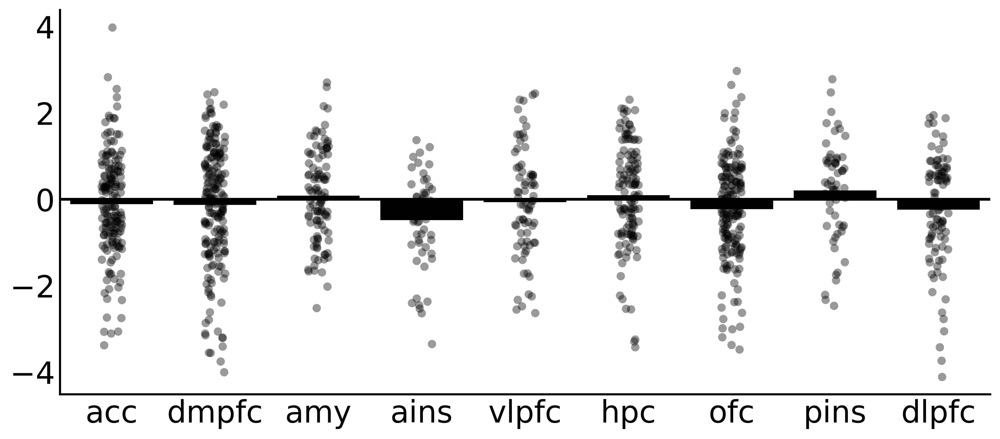

In [24]:
# plot_roi_model_results(results,'roi',cpe_var,bar_order=keep_rois,figsize=(12,5),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=fig_save_path,fig_id=fig_id,dpi=400)

plot_roi_model_results(results,'roi','Z_Score_norm_mood',figsize=(12,5),color='k')



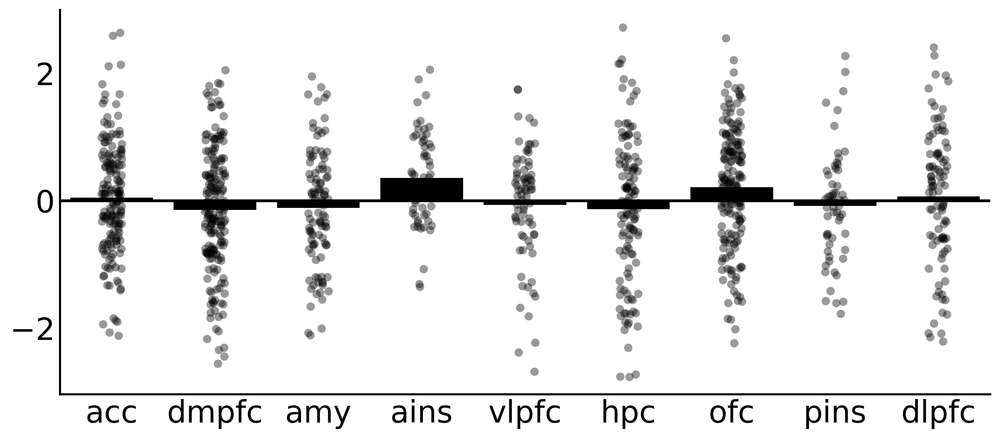

In [25]:
plot_roi_model_results(results,'roi','Z_Score_cpe_t1',figsize=(12,5),color='k')


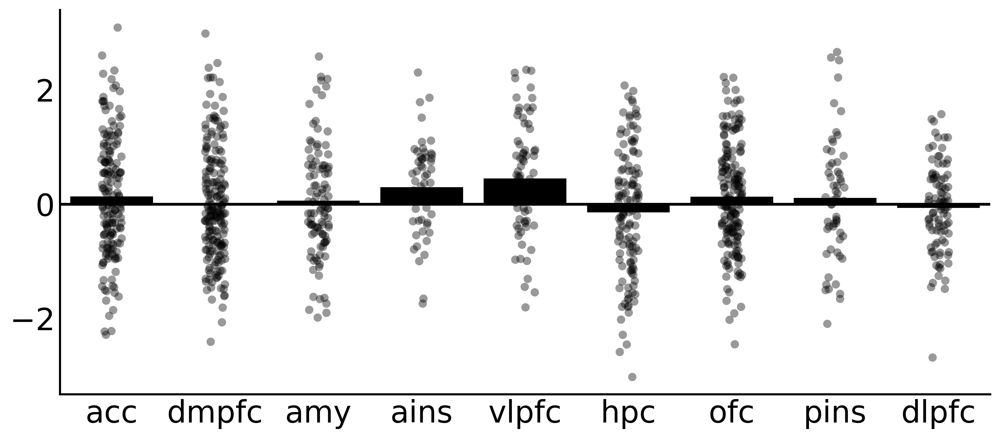

In [26]:
plot_roi_model_results(results,'roi','Z_Score_mood_cpe_int',figsize=(12,5),color='k')


## BDI correlations

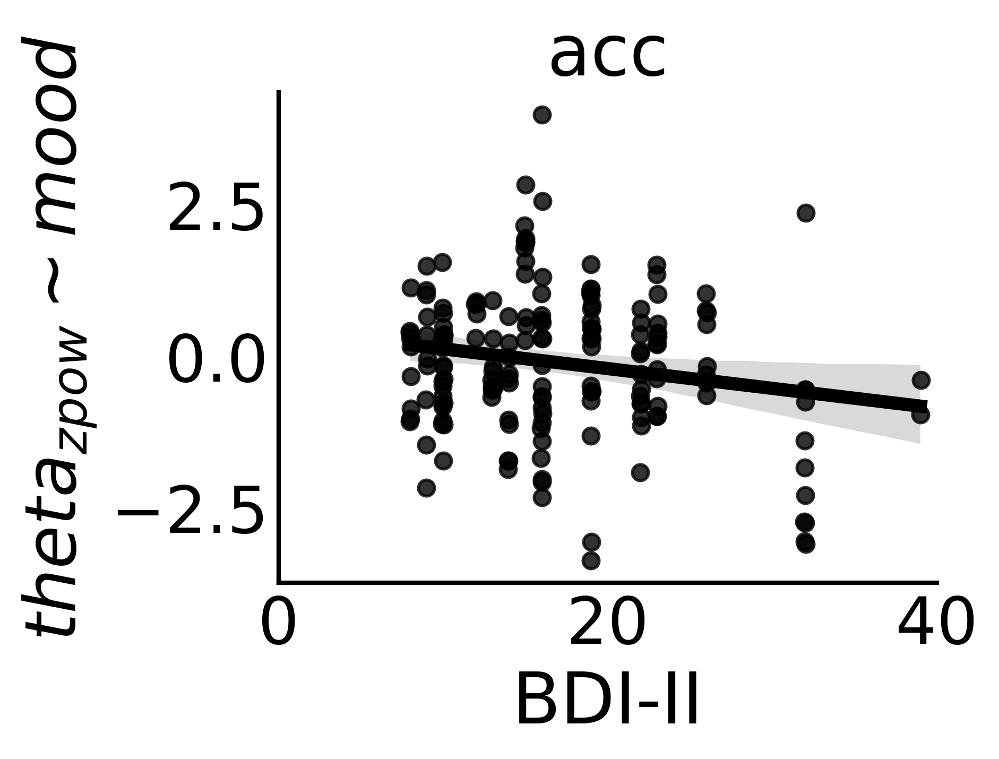

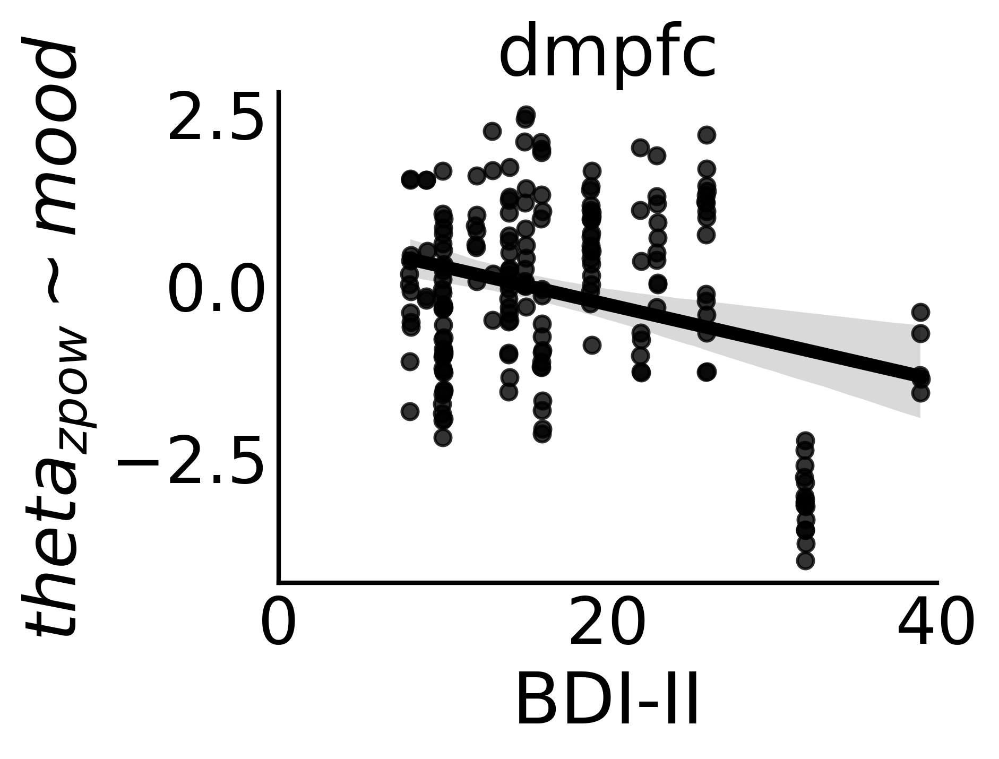

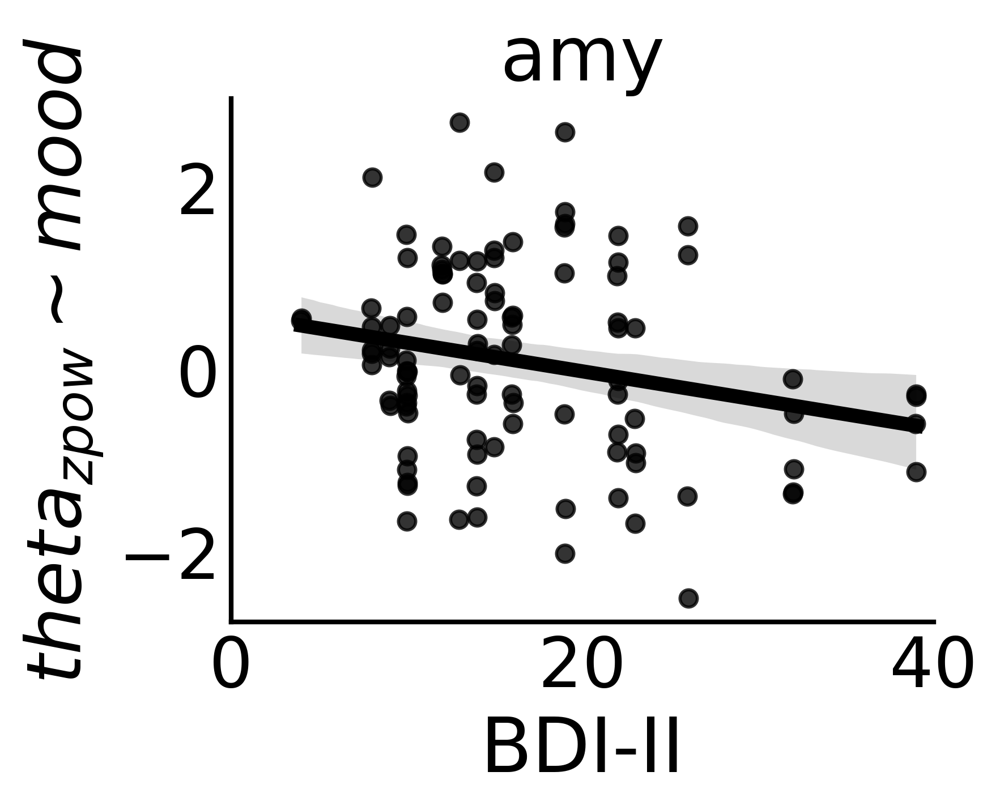

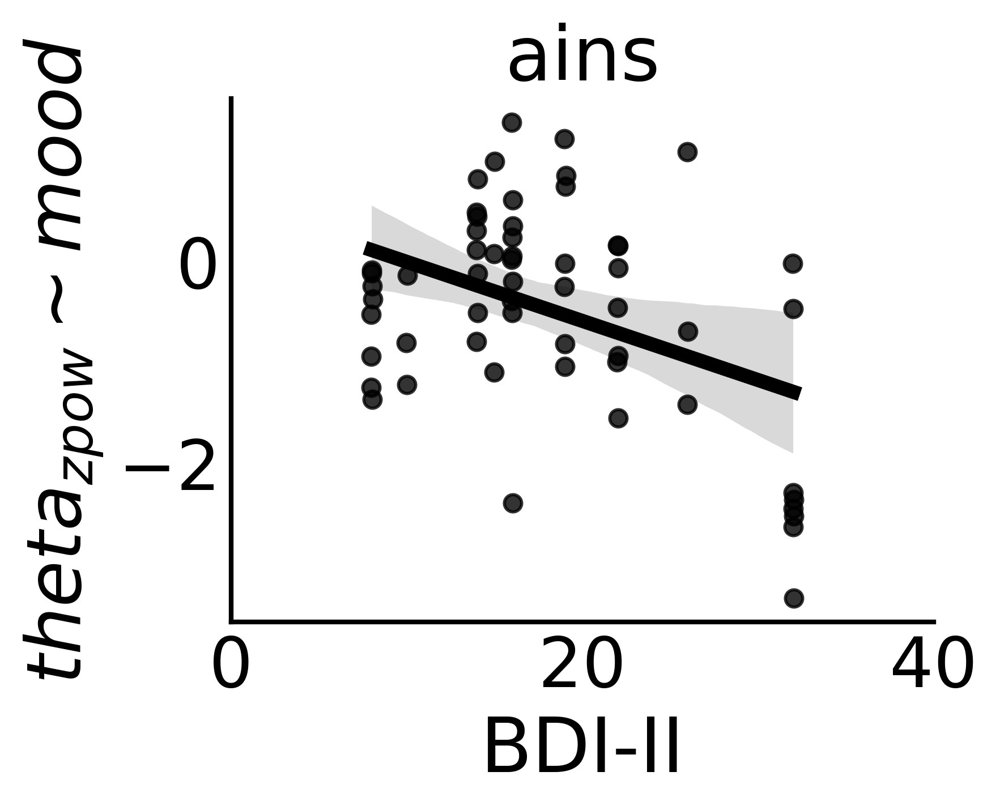

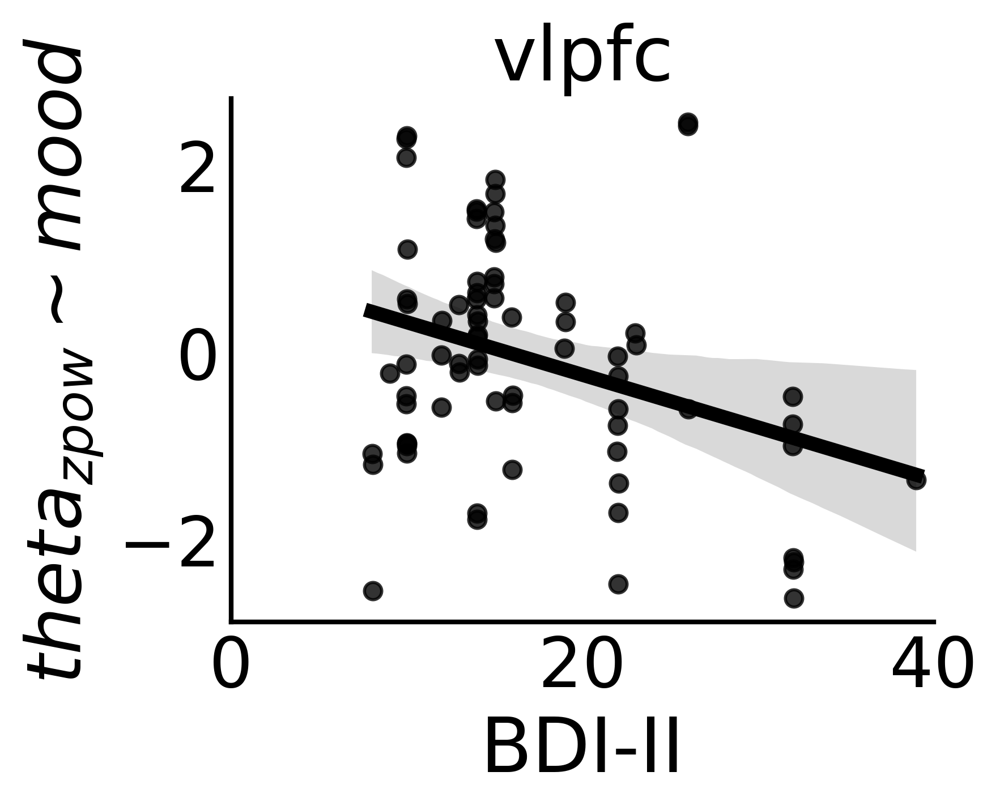

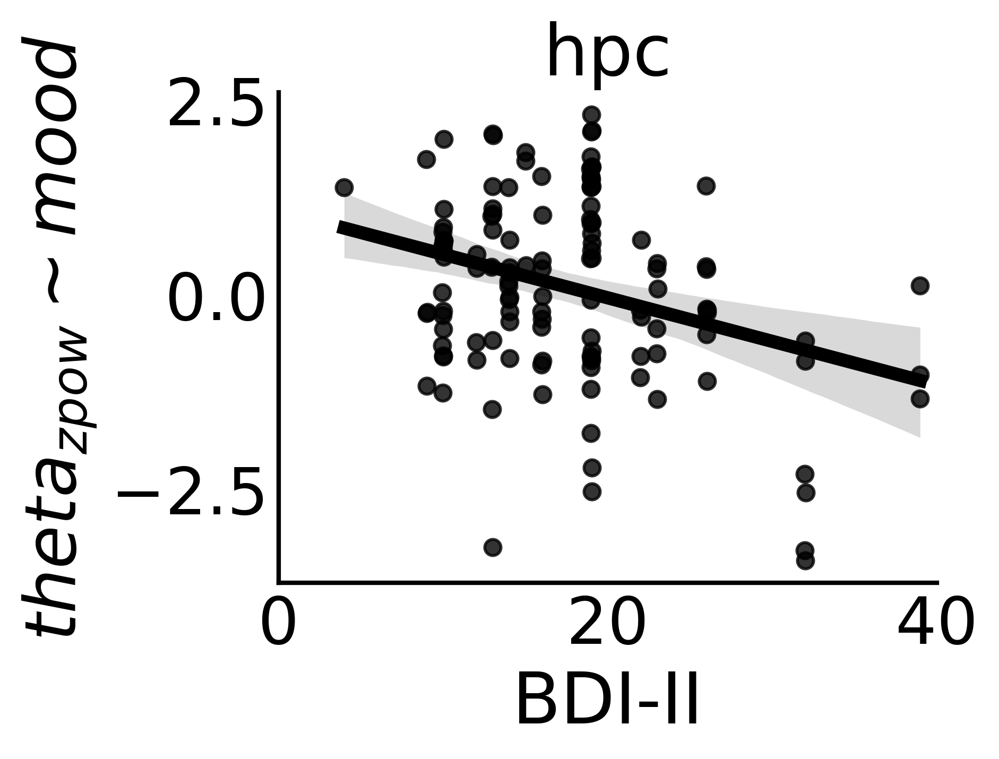

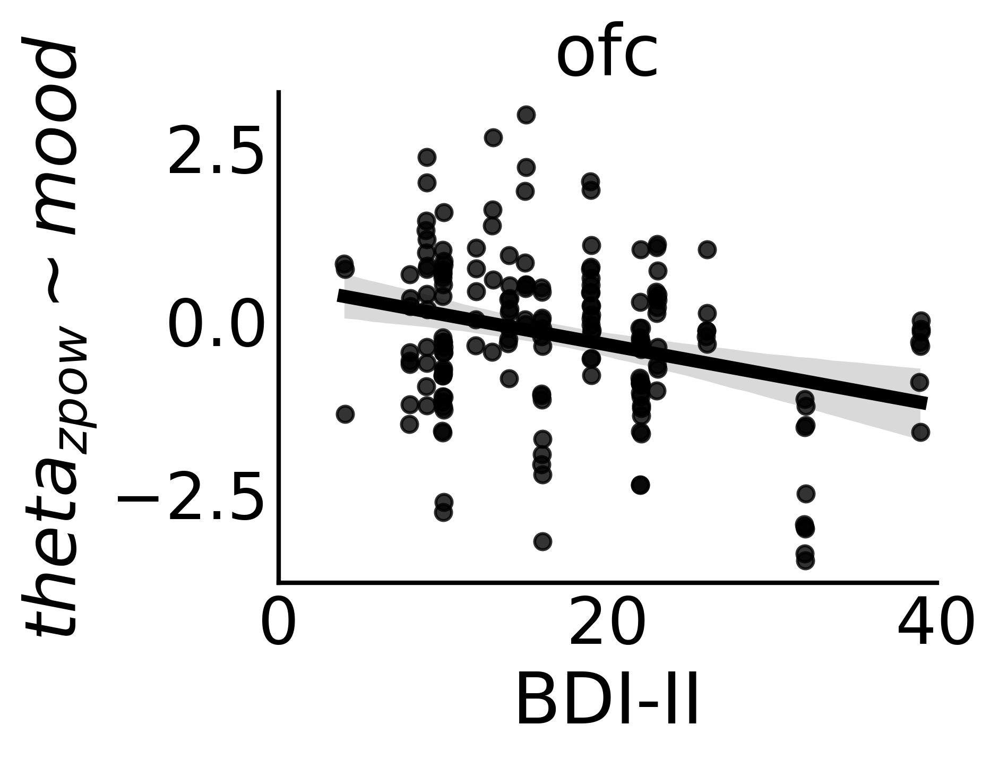

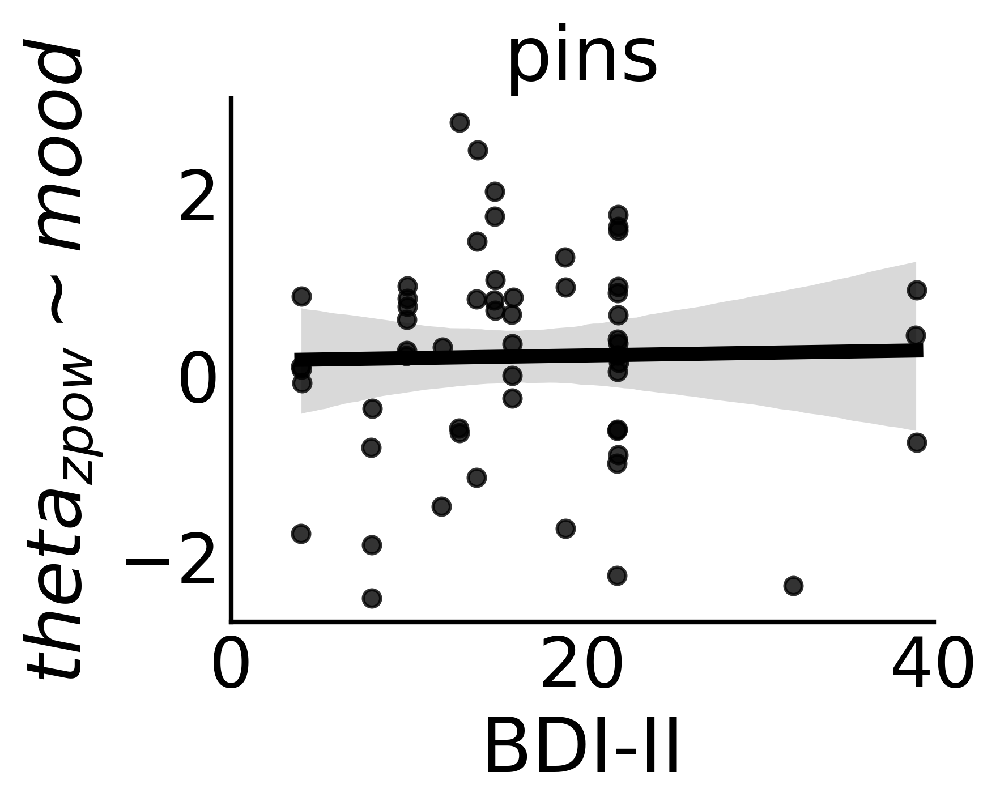

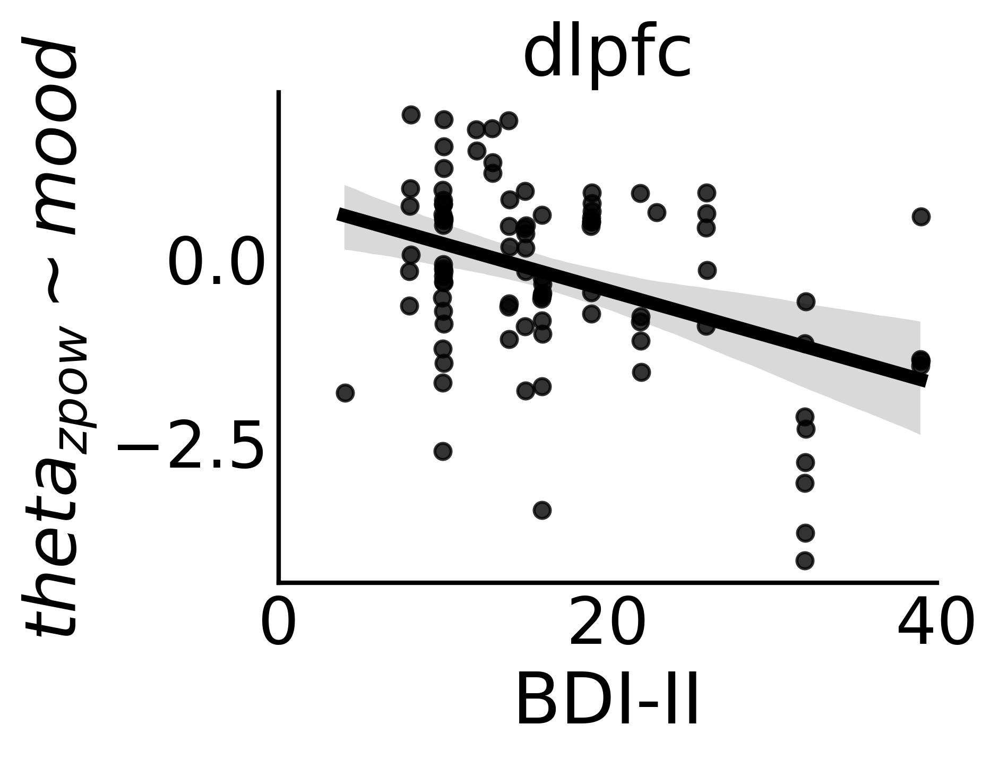

In [27]:

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


### Test BDI Correlations via robust regression

In [28]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:29:31                                         
No. Iterations:                    12                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5222      0.503     32.848     

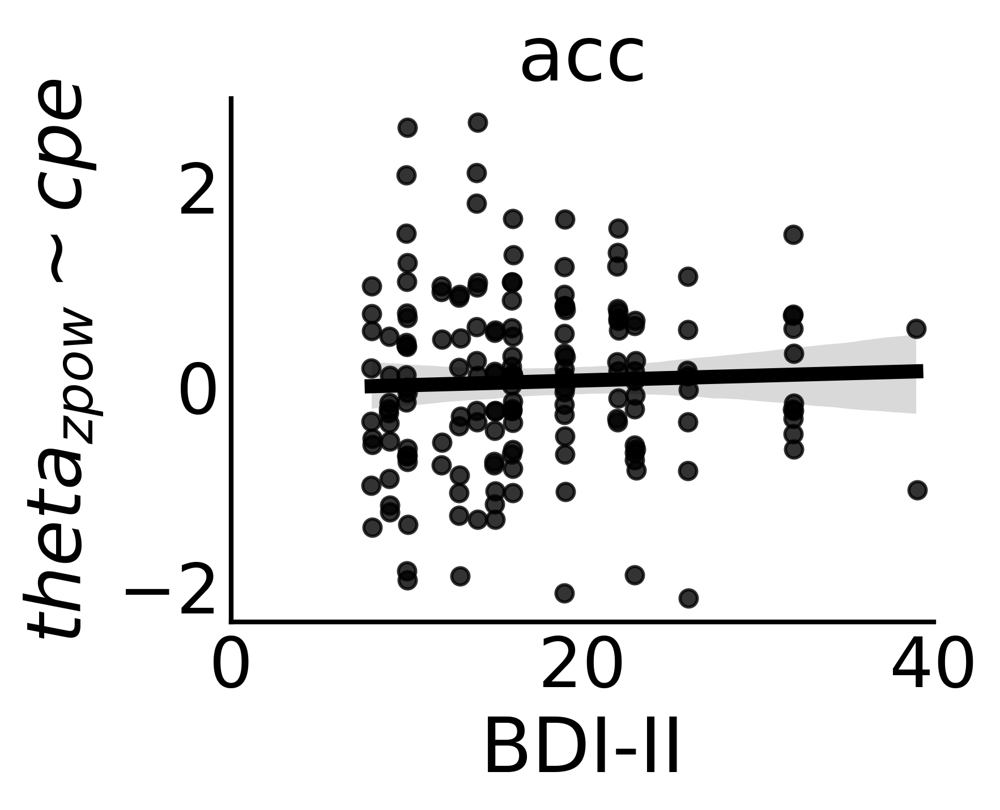

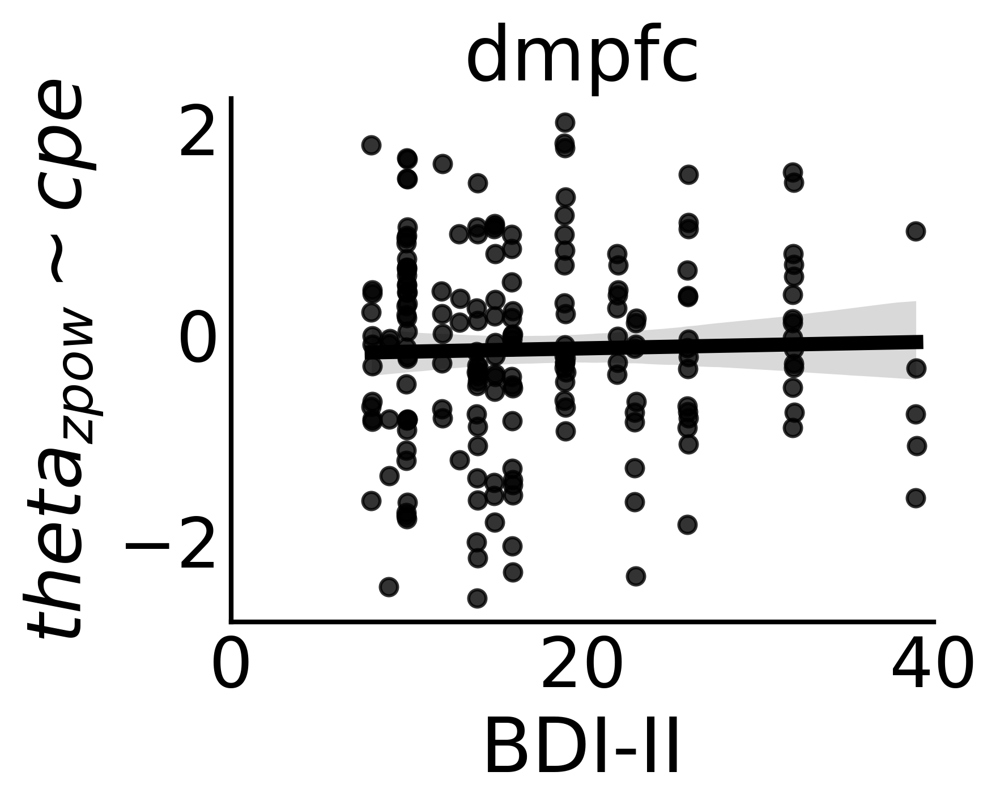

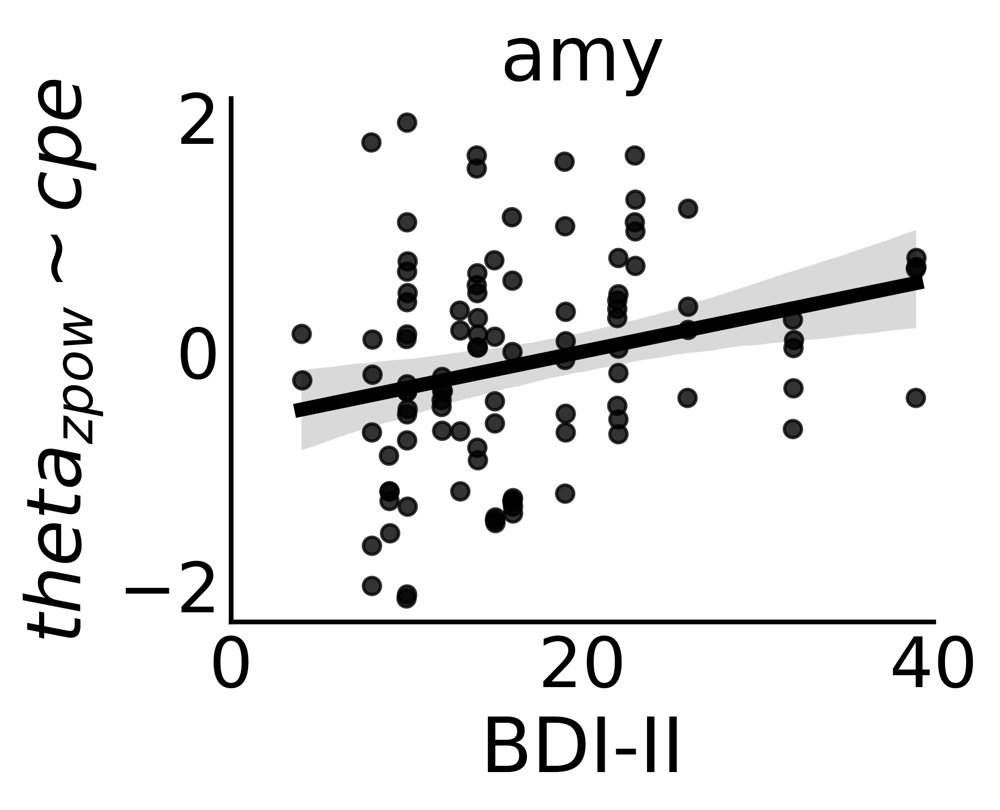

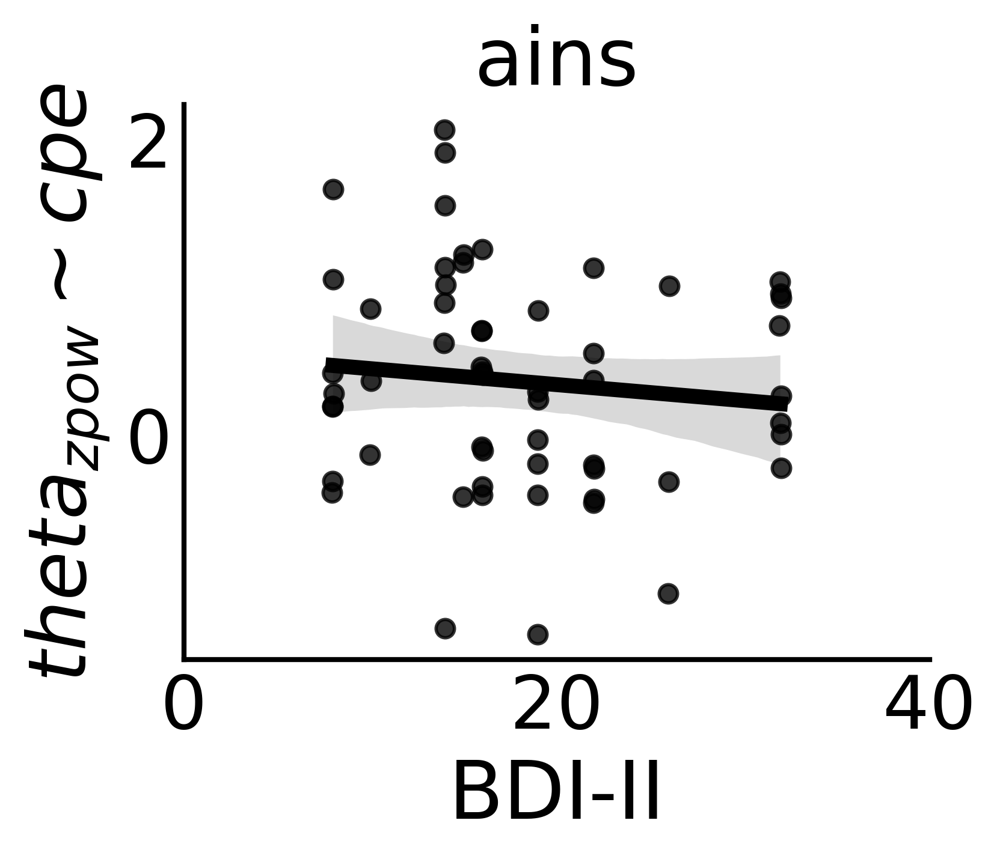

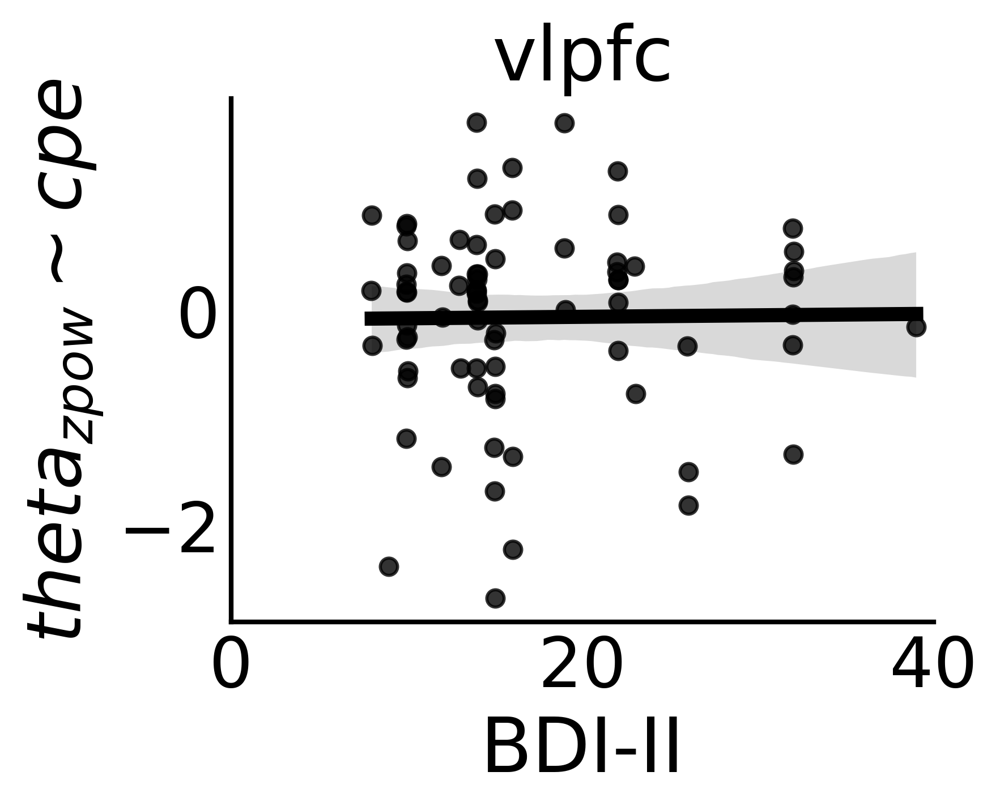

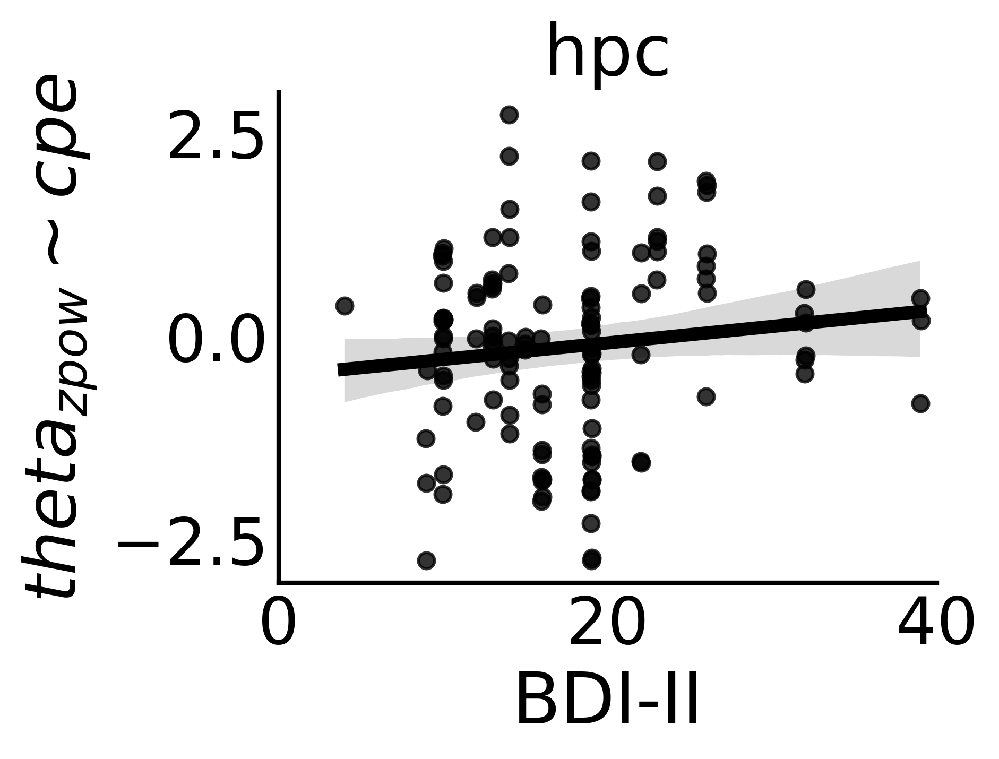

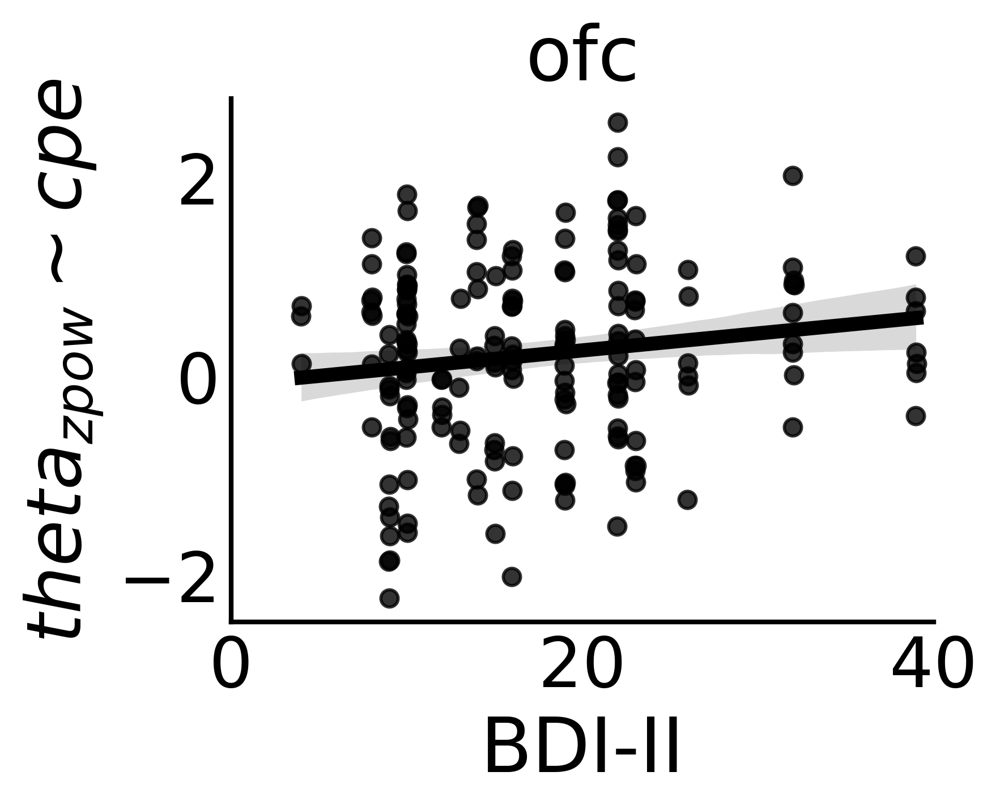

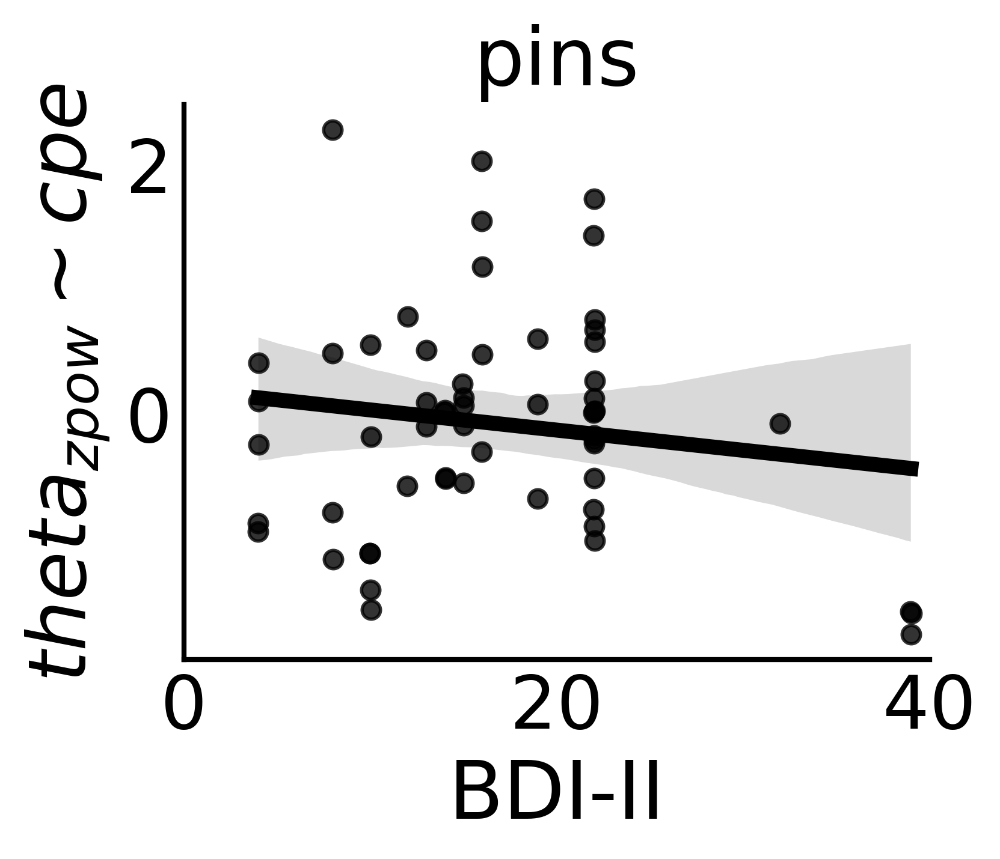

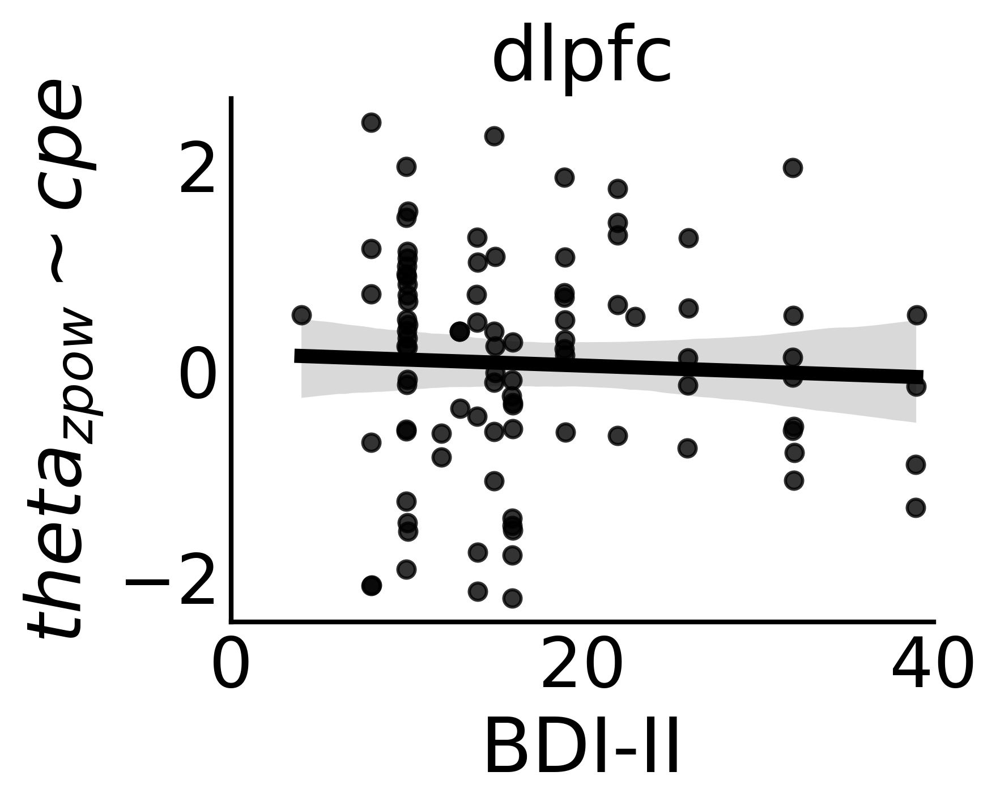

In [29]:
###### CPE CORR 

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [30]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:29:36                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5812      0.491     33.776     

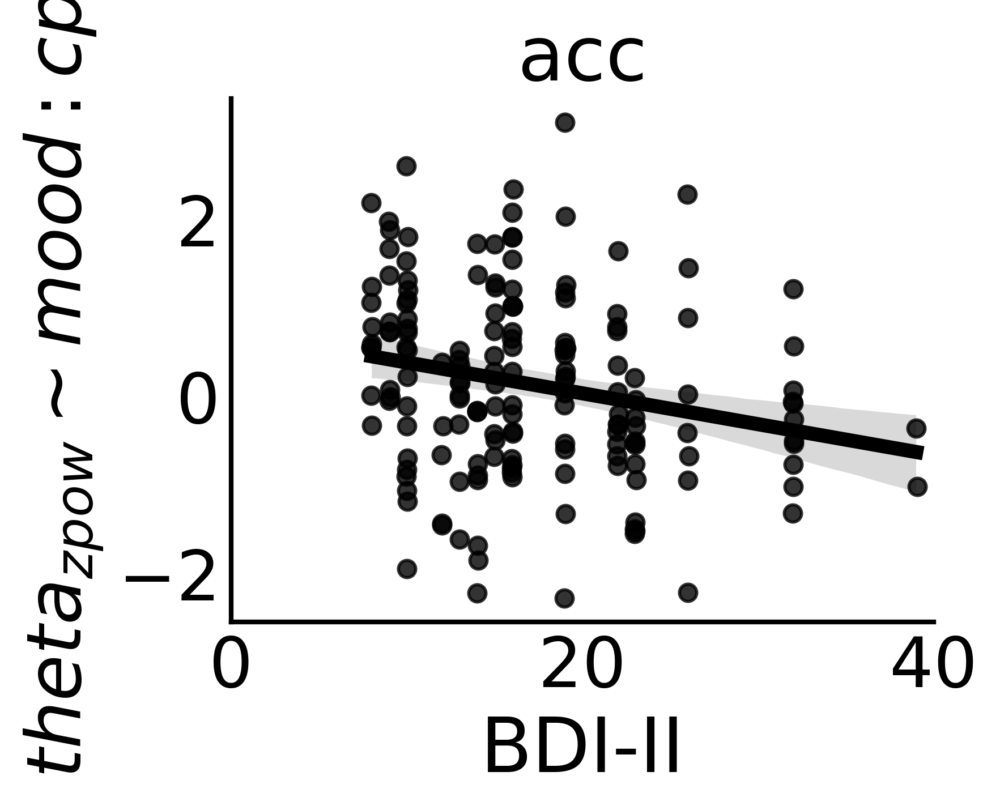

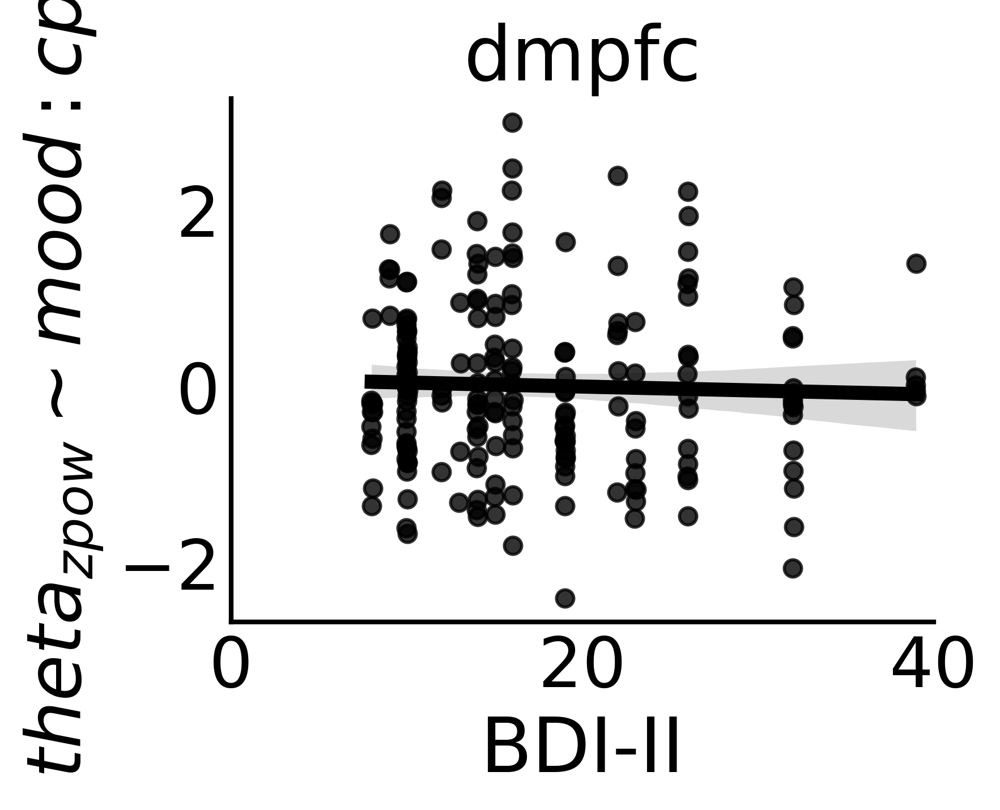

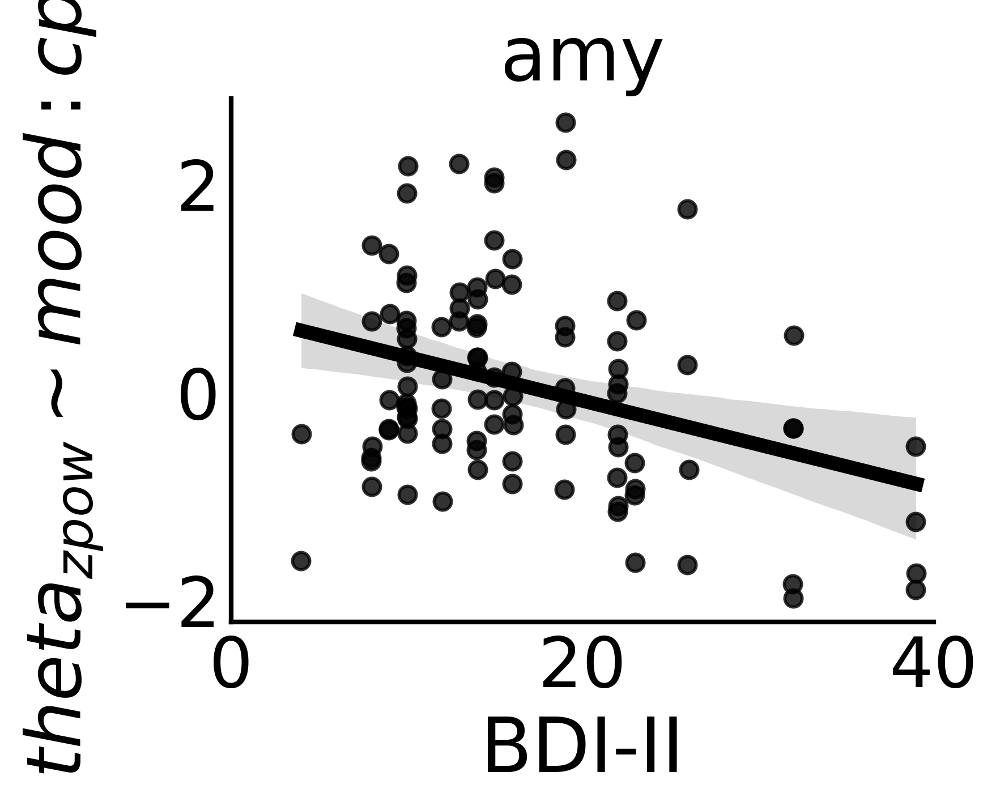

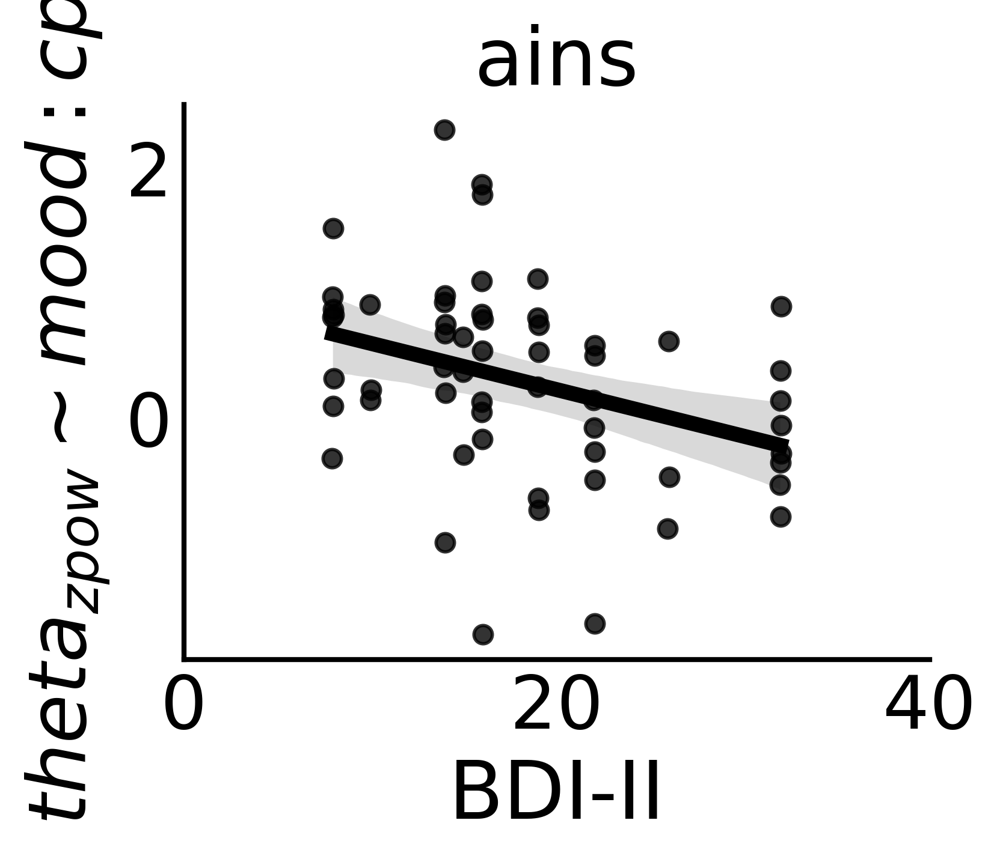

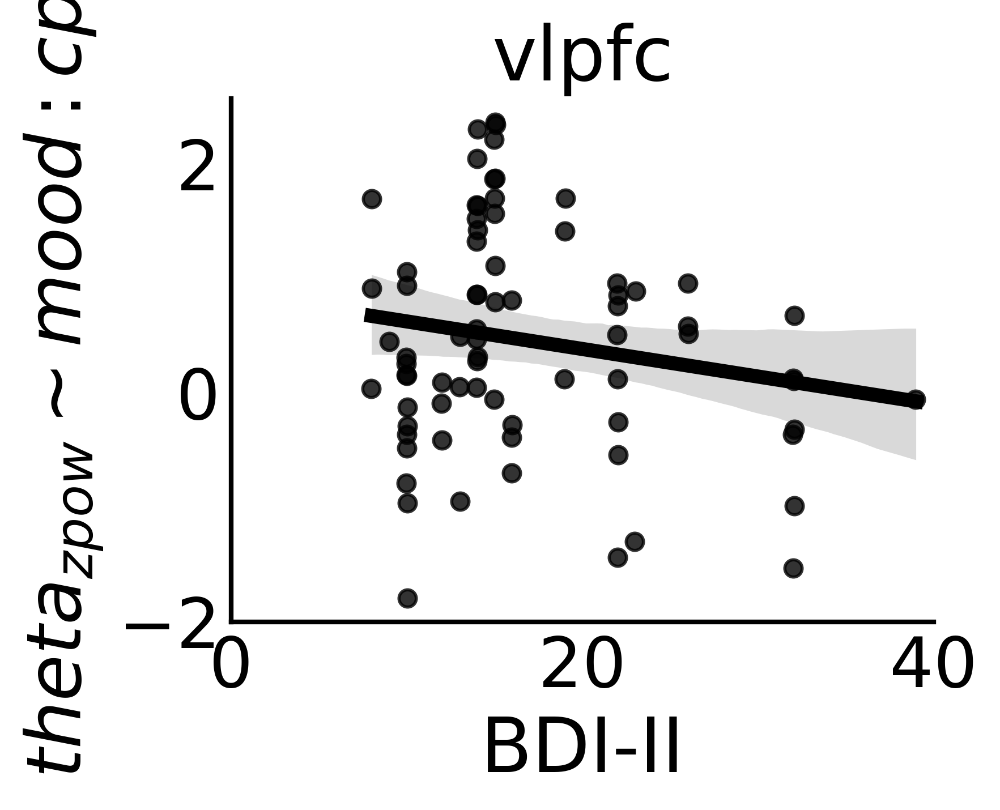

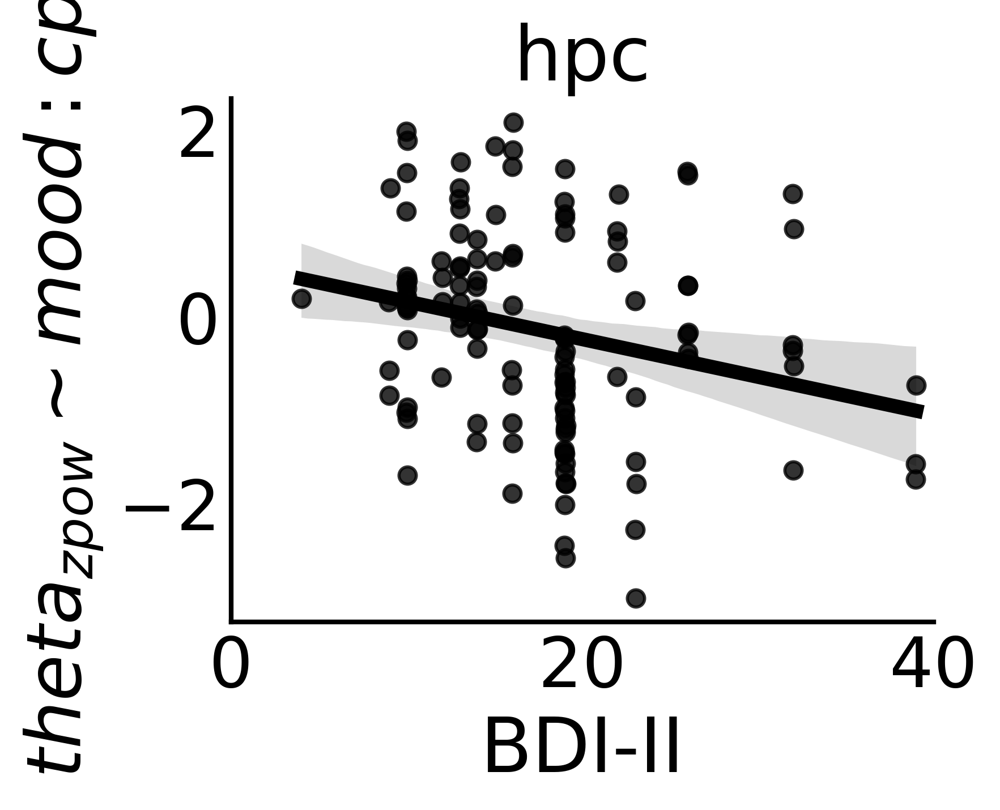

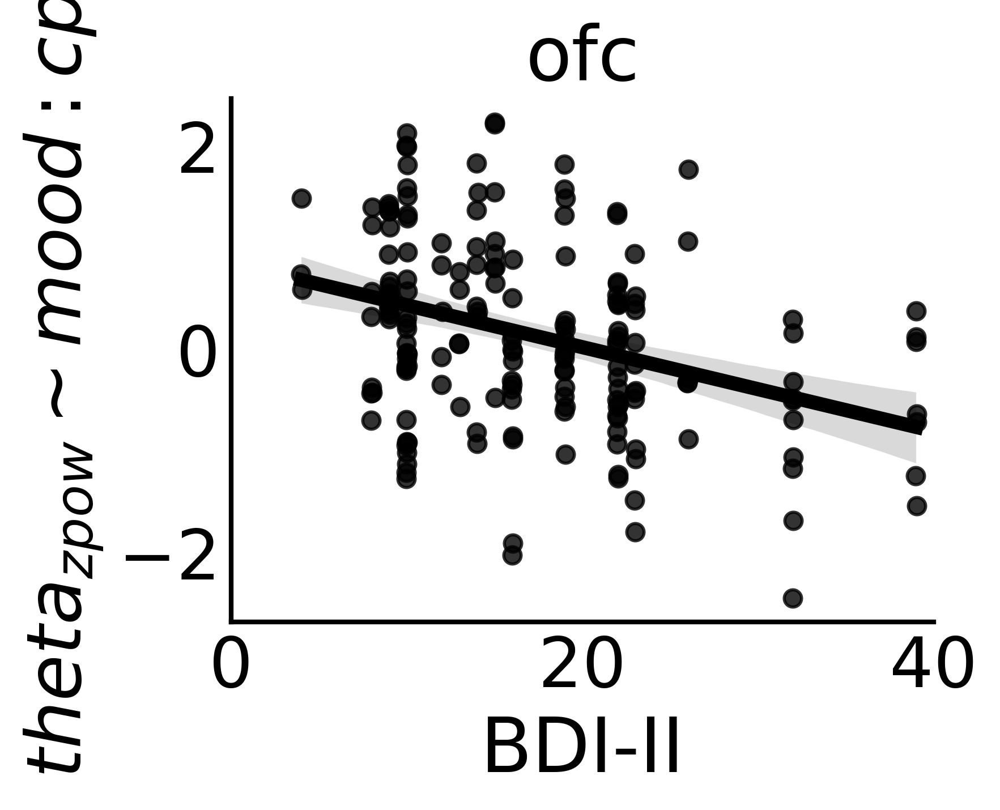

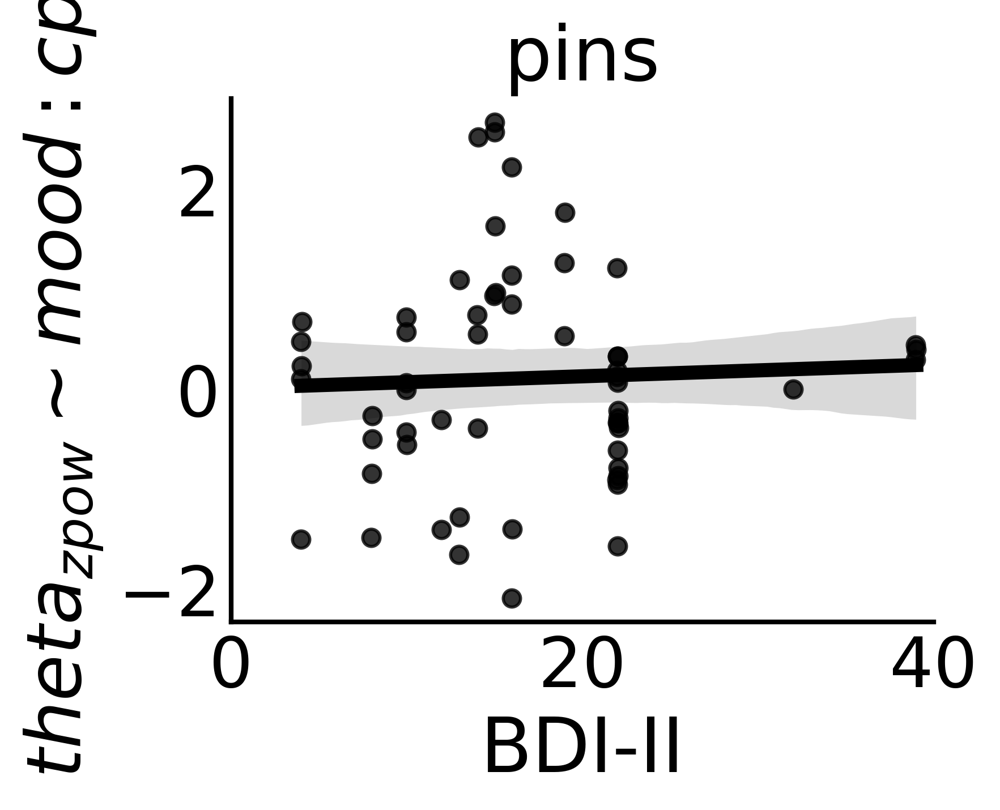

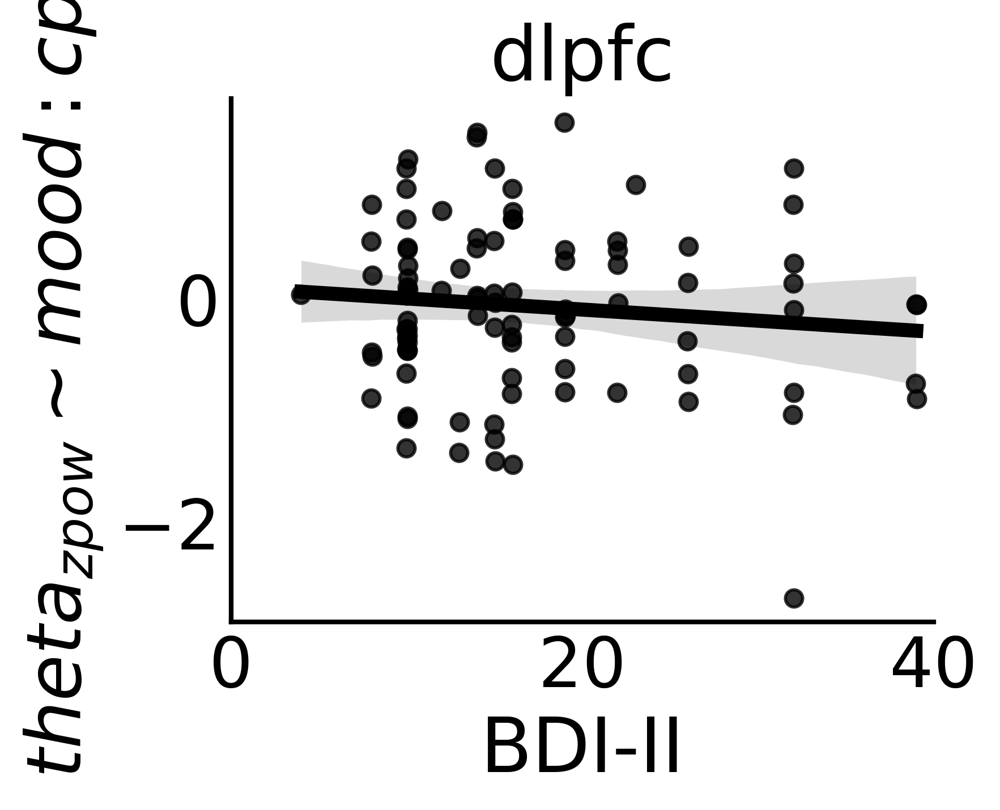

In [31]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_mood_cpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood:cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [32]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_mood_cpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        22:29:40                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.7629      0.488     34.337     

# Run ROI MLMs 

In [9]:
mood_pow_df.columns

Index(['Unnamed: 0', 'epoch', 'time', 'freq', 'reref_ch_names', 'band_pow',
       'band', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'Rating',
       'RatingOnset', 'RT', 'Round_t1_idx', 'Round_t2_idx', 'Round_t3_idx',
       'epoch_t1_idx', 'epoch_t2_idx', 'epoch_t3_idx', 'norm_mood',
       'MoodChoiceOnset', 'SafeBet_t1', 'SafeBet_t2', 'SafeBet_t3',
       'LowBet_t1', 'LowBet_t2', 'LowBet_t3', 'HighBet_t1', 'HighBet_t2',
       'HighBet_t3', 'Profit_t1', 'Profit_t2', 'Profit_t3', 'TotalProfit_t1',
       'TotalProfit_t2', 'TotalProfit_t3', 'GambleEV_t1', 'GambleEV_t2',
       'GambleEV_t3', 'TrialEV_t1', 'TrialEV_t2', 'TrialEV_t3', 'CR_t1',
       'CR_t2', 'CR_t3', 'choiceEV_t1', 'choiceEV_t2', 'choiceEV_t3', 'rpe_t1',
       'rpe_t2', 'rpe_t3', 'cf_t1', 'cf_t2', 'cf_t3', 'cpe_t1', 'cpe_t2',
       'cpe_t3', 'mood_epoch_len', 'next_round_start', 'roi', 'hemi',
       'unique_reref_ch'],
      dtype='object')

In [10]:
outcome_var  = 'band_pow'
rand_eff_var = 'unique_reref_ch'
# reg_vars     = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
# rand_vars    = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
reg_vars     = ['norm_mood','cpe_t1','norm_mood:cpe_t1']
rand_vars    = ['norm_mood','cpe_t1','norm_mood:cpe_t1']


In [11]:
fit_dict = {f'{roi}':fit_mixed_model(mood_pow_df[mood_pow_df.roi==roi],
                                        reg_vars,rand_vars,outcome_var,rand_eff_var) 
                for roi in mood_pow_df.roi.unique().tolist()}

In [12]:
fit_dict

{'acc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7d9fd76e0>,
 'dmpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7d9e02ed0>,
 'amy': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4a8d70>,
 'ains': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da0e05f0>,
 'vlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41fd40>,
 'hpc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4b1e80>,
 'ofc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41f200>,
 'pins': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41f290>,
 'dlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4b2b40>}

In [13]:
fit_results = []

for roi in list(fit_dict.keys()):
    roi_fit = mixed_eff_results_df(fit_dict[roi],mood_pow_df[mood_pow_df.roi==roi],
                                    rand_eff_var=rand_eff_var,region_type='roi')
    fit_results.append(roi_fit)
    
fit_results = pd.concat(fit_results).reset_index(drop=True)
fit_results['band'] = band
# fit_results.to_csv(f'{save_dir}beta_coh_mlm_roi_fit_results_{date}.csv')

In [14]:
fit_results

,unique_reref_ch,subj_id,region_type,bdi,raw_Intercept,raw_norm_mood,raw_cpe_t1,raw_norm_mood:cpe_t1,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,band
0,DA023_lac1-lac2,DA023,acc,14,-0.021410,0.002241,-0.002239,-0.041193,-0.044907,0.008290,0.001861,-0.042033,beta
1,DA023_lac2-lac3,DA023,acc,14,0.017663,0.004149,0.005140,-0.018841,-0.005834,0.010198,0.009241,-0.019681,beta
2,DA023_lac3-lac4,DA023,acc,14,0.035745,0.002318,0.005430,-0.046636,0.012248,0.008368,0.009530,-0.047475,beta
3,MS002_lacas1-lacas2,MS002,acc,14,0.004634,0.004464,0.010928,-0.033210,-0.018863,0.010513,0.015028,-0.034049,beta
4,MS002_lacas2-lacas3,MS002,acc,14,-0.006538,0.002475,-0.002108,0.007301,-0.030035,0.008525,0.001993,0.006462,beta
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,MS048_lacas8-lacas9,MS048,dlpfc,19,0.024683,-0.034102,-0.018029,0.008054,0.009007,-0.057338,-0.005536,0.033309,beta
1046,MS048_lacas9-lacas10,MS048,dlpfc,19,0.003247,0.010993,-0.021240,-0.002087,-0.012429,-0.012243,-0.008748,0.023168,beta
1047,MS048_racas10-racas11,MS048,dlpfc,19,0.013032,0.028619,0.017156,-0.003087,-0.002644,0.005383,0.029649,0.022167,beta
1048,MS048_racas11-racas12,MS048,dlpfc,19,-0.028612,0.019419,0.029429,-0.005522,-0.044288,-0.003817,0.041922,0.019732,beta


In [22]:
# roi_fit_results

fe_params_results = {f'{roi}':fit_dict[roi].fe_params for roi in list(fit_dict.keys())}
fe_results = []
for fe_res in fe_params_results:
    fe_results.append(pd.DataFrame({**dict(fe_params_results[fe_res]),**{'roi':fe_res}},index=[0]))
    
fe_results = pd.concat(fe_results).reset_index(drop=True)
fe_results['mood_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood'],4) for roi in fe_results.roi.tolist()]
fe_results['cpe_pval'] = [np.round(fit_dict[roi].pvalues['cpe_t1'],4) for roi in fe_results.roi.tolist()]
fe_results['mood-cpe_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood:cpe_t1'],4) for roi in fe_results.roi.tolist()]

fe_results


,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,roi,mood_pval,cpe_pval,mood-cpe_pval
0,-0.023497,0.006049,0.004100,-0.000839,acc,0.2522,0.4515,0.9435
1,-0.026731,-0.016848,-0.011448,0.004372,dmpfc,0.0495,0.2134,0.7160
2,-0.018749,0.012562,-0.001356,-0.019668,amy,0.0905,0.8434,0.2261
3,-0.031661,0.005191,-0.000274,-0.018217,ains,0.6170,0.9793,0.4063
4,-0.023335,0.020999,0.001940,0.044864,vlpfc,0.0290,0.8504,0.0296
5,-0.028649,0.007931,-0.005064,-0.017446,hpc,0.2914,0.4968,0.2819
6,-0.026932,0.001337,-0.000879,0.005247,ofc,0.8137,0.8825,0.6698
7,-0.044509,0.018150,-0.021562,0.026130,pins,0.0134,0.0047,NaN
8,-0.015676,-0.023236,0.012492,0.025254,dlpfc,0.0574,0.3983,0.0905


In [27]:
fe_results.set_index('roi')

,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,mood_pval,cpe_pval,mood-cpe_pval
roi,,,,,,,
acc,-0.023497,0.006049,0.004100,-0.000839,0.2522,0.4515,0.9435
dmpfc,-0.026731,-0.016848,-0.011448,0.004372,0.0495,0.2134,0.7160
amy,-0.018749,0.012562,-0.001356,-0.019668,0.0905,0.8434,0.2261
ains,-0.031661,0.005191,-0.000274,-0.018217,0.6170,0.9793,0.4063
vlpfc,-0.023335,0.020999,0.001940,0.044864,0.0290,0.8504,0.0296
hpc,-0.028649,0.007931,-0.005064,-0.017446,0.2914,0.4968,0.2819
ofc,-0.026932,0.001337,-0.000879,0.005247,0.8137,0.8825,0.6698
pins,-0.044509,0.018150,-0.021562,0.026130,0.0134,0.0047,NaN
dlpfc,-0.015676,-0.023236,0.012492,0.025254,0.0574,0.3983,0.0905


In [28]:
bonferr_alpha = 0.05/len(fe_results)
# bonferr_alpha = 0.01

bonferr_alpha



0.005555555555555556

In [29]:
# sig_cpe_rois = fe_results.roi[fe_results.cpe_pval <= bonferr_alpha].tolist()
# sig_cpe_rois

sig_mood_rois = fe_results.roi[fe_results.mood_pval <= bonferr_alpha].tolist()
sig_mood_rois



[]

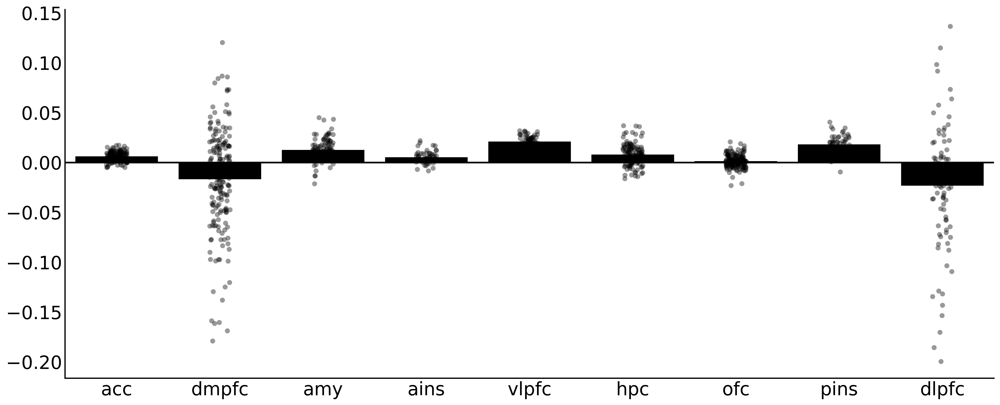

In [30]:
plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),dpi=400)

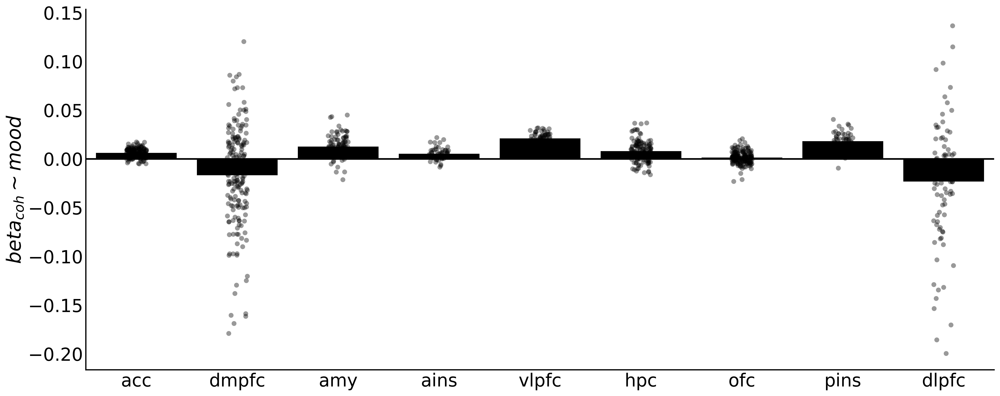

In [31]:
ylabel = fr'${band}_{{coh}} \sim mood$'
# fig_save_dir = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/results/single-electrode-regressions/'
fig_id = f'{band}_beta_mood_mlm_barplot.pdf'


plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),color='k',
                       ylabel=ylabel,save_fig=True,save_dir=save_dir,fig_id=fig_id,dpi=400)


# plot_roi_model_results(fit_results,'region_type','cpe',bar_order = plot_pairs,figsize=(12,4),color='k')



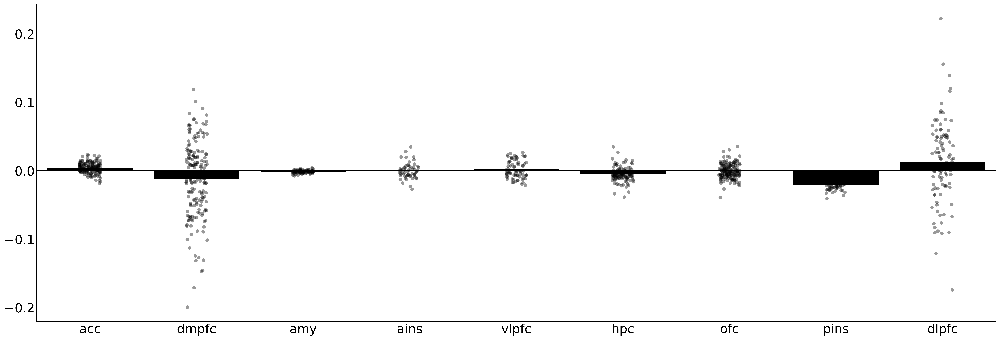

In [34]:
plot_roi_model_results(fit_results,'region_type','cpe_t1',figsize=(30,10),color='k')


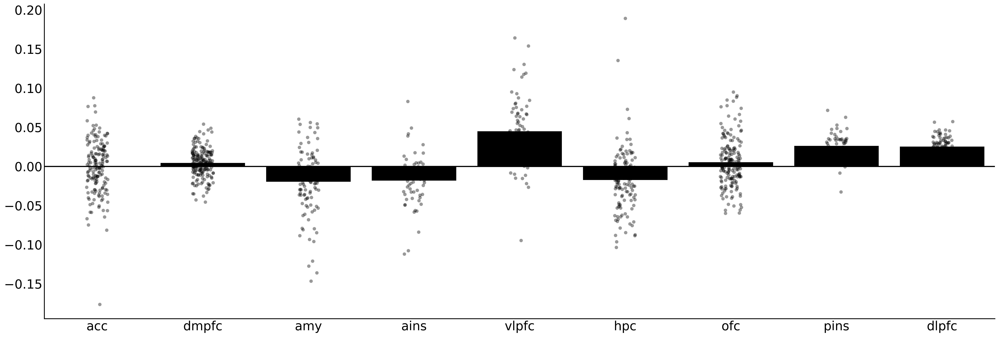

In [35]:
plot_roi_model_results(fit_results,'region_type','norm_mood:cpe_t1',figsize=(30,10),color='k')


# Mood Weights BDI Correlation

In [36]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.norm_mood)
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr -0.012992052666624926 0.8676530746900165
dmpfc pearsonr -0.34401235853449097 9.65882078590697e-07
amy pearsonr -0.3013614830496465 0.0020840762650160844
ains pearsonr -0.2887332138693388 0.029389887417716958
vlpfc pearsonr -0.08647677951342798 0.4606871623650381
hpc pearsonr -0.32061423733229744 0.00028301136105406827
ofc pearsonr -0.02998644528676271 0.6902835698535636
pins pearsonr 0.391509976611075 0.0023731428196593525
dlpfc pearsonr -0.19090079817574715 0.06386512336115725


In [37]:
sig_rho

[('dmpfc', -0.34401235853449097, 9.65882078590697e-07),
 ('amy', -0.3013614830496465, 0.0020840762650160844),
 ('ains', -0.2887332138693388, 0.029389887417716958),
 ('hpc', -0.32061423733229744, 0.00028301136105406827),
 ('pins', 0.391509976611075, 0.0023731428196593525)]

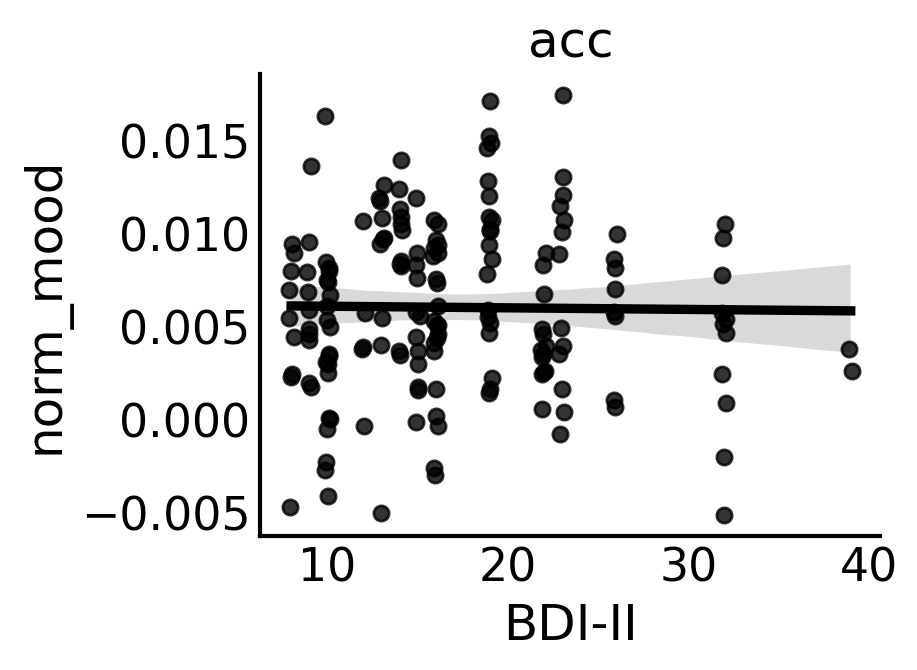

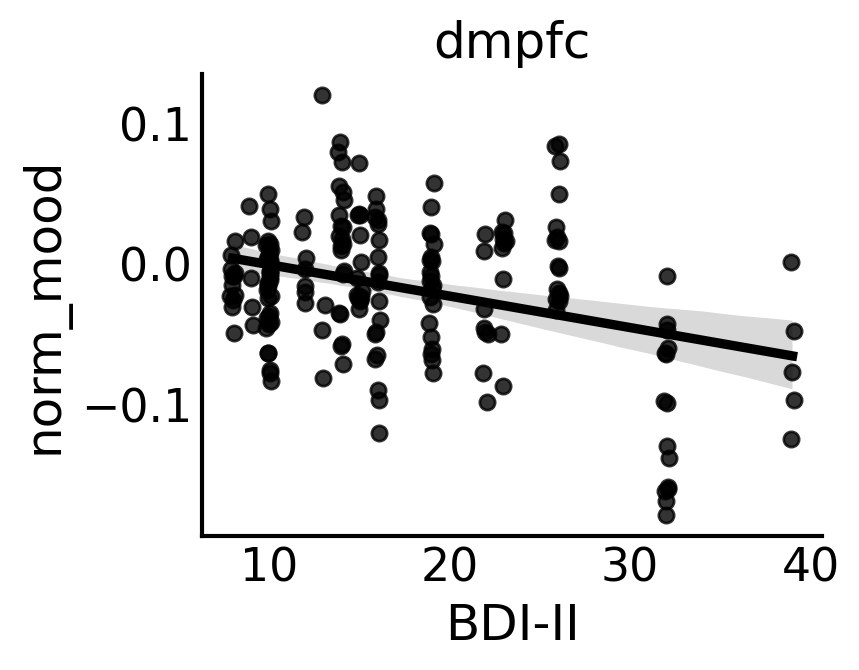

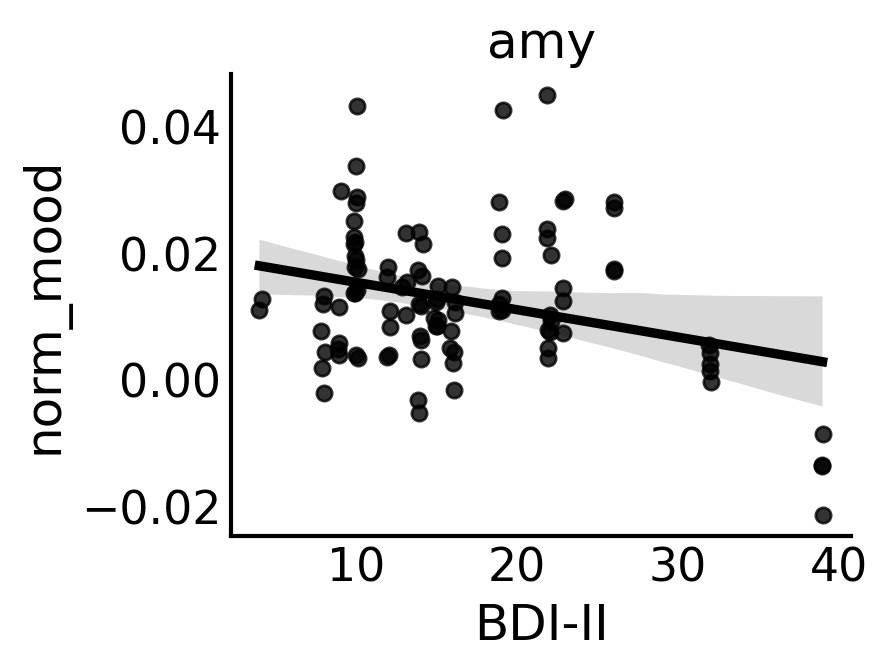

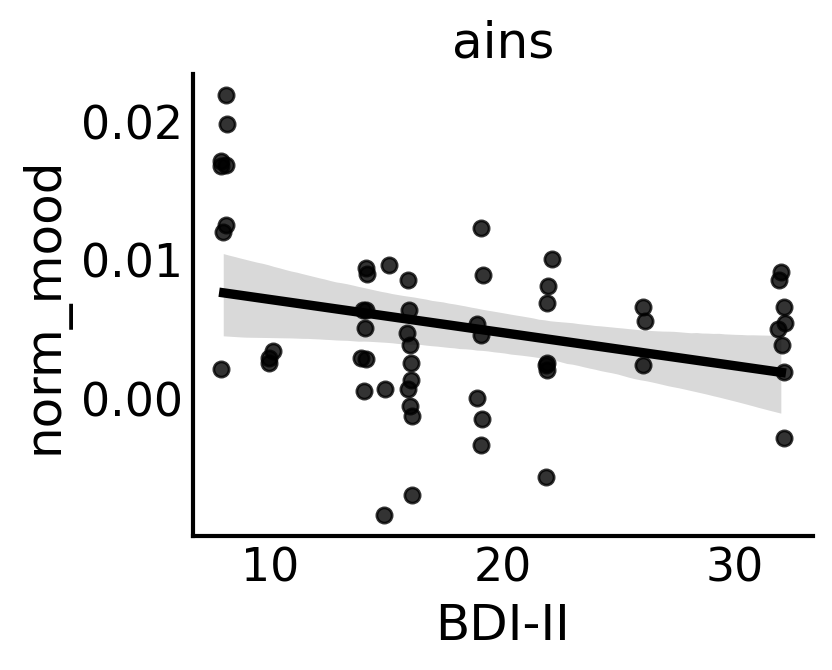

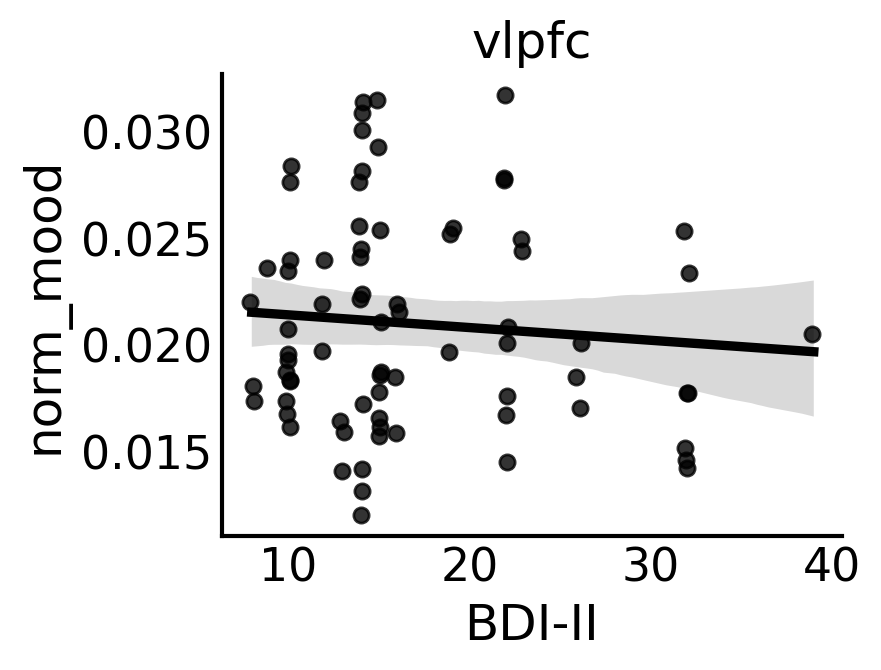

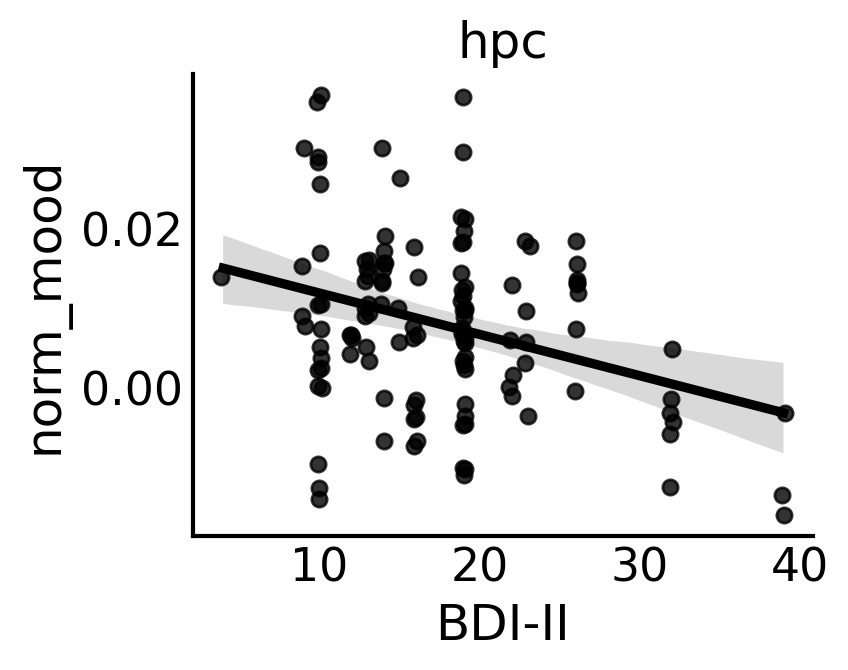

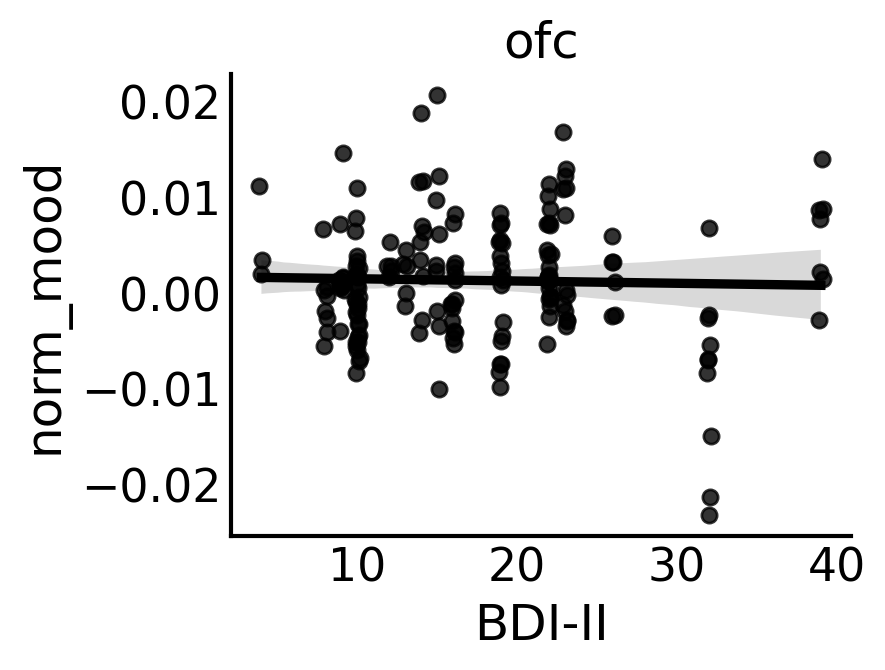

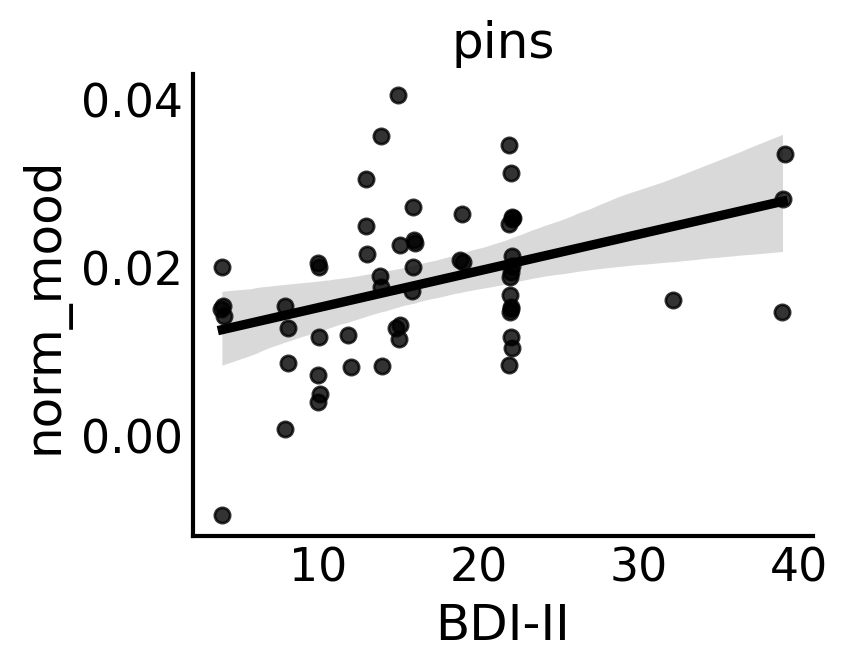

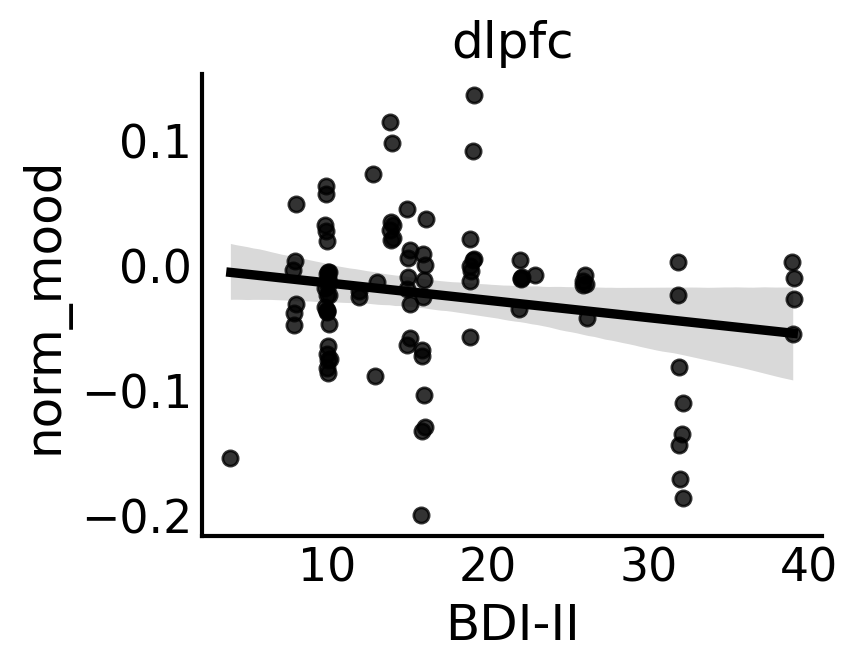

In [38]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [39]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:41:25                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4399      0.829     19.823     

# CPE Weights BDI Correlation

In [40]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.cpe_t1)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))

    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.01959416468069404 0.8015553636204692
dmpfc pearsonr -0.000507255471765708 0.9944138638065453
amy pearsonr -0.2960967074191132 0.0025141103469552366
ains pearsonr -0.27217698368571297 0.04053935825081696
vlpfc pearsonr 0.05807537423351698 0.6206579532710138
hpc pearsonr -0.21642749052649218 0.015764859226709758
ofc pearsonr 0.0024370971853468447 0.9741708028986262
pins pearsonr 0.3696274876050088 0.004295473588058934
dlpfc pearsonr -0.14698347783996402 0.15520486615282508


In [41]:
sig_rho

[('amy', -0.2960967074191132, 0.0025141103469552366),
 ('ains', -0.27217698368571297, 0.04053935825081696),
 ('hpc', -0.21642749052649218, 0.015764859226709758),
 ('pins', 0.3696274876050088, 0.004295473588058934)]

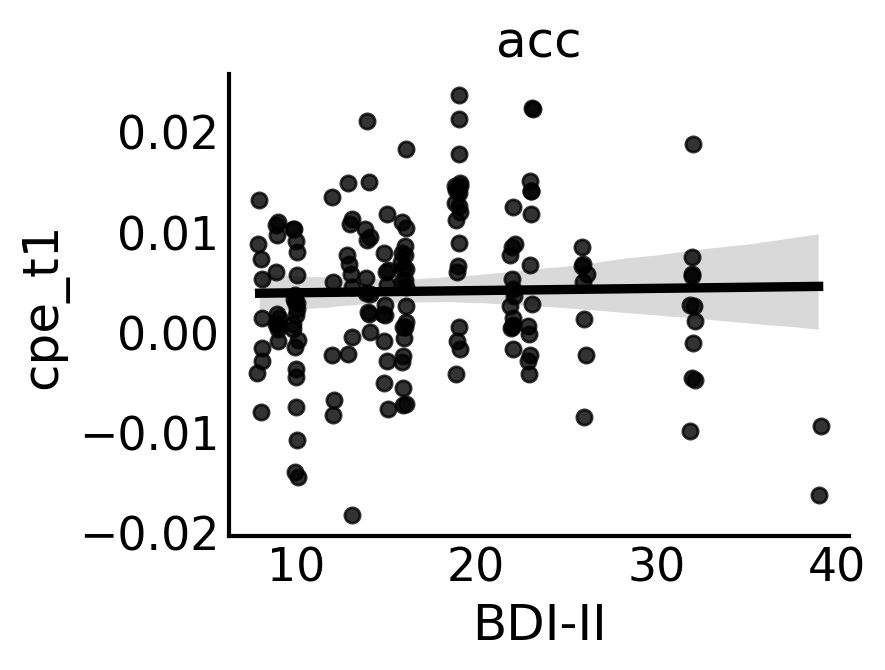

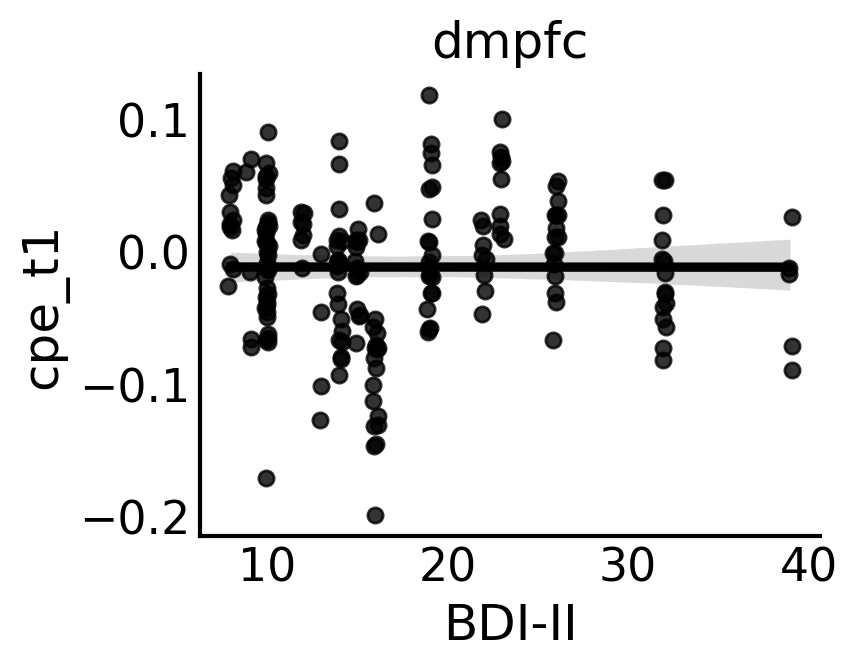

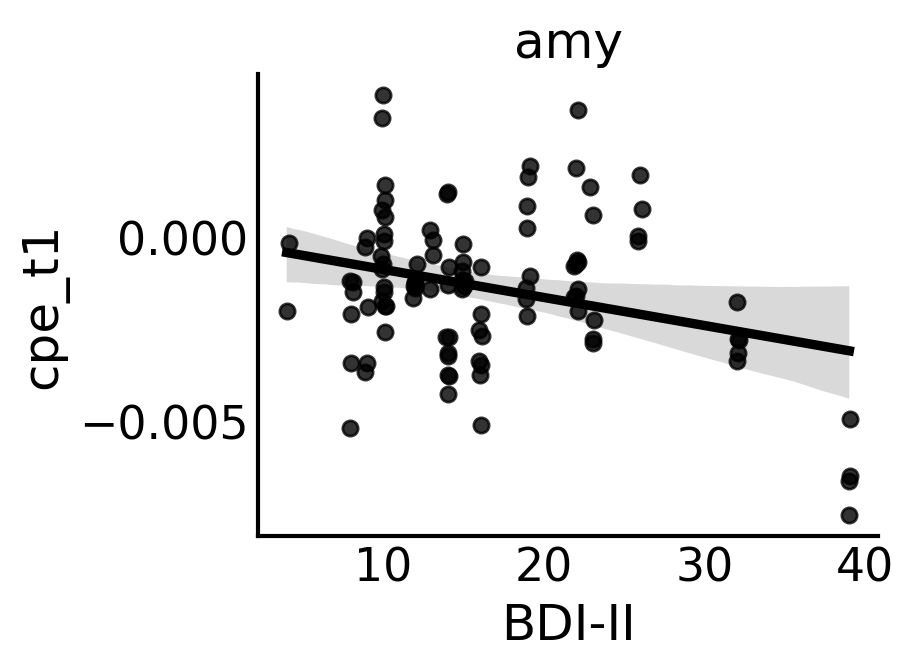

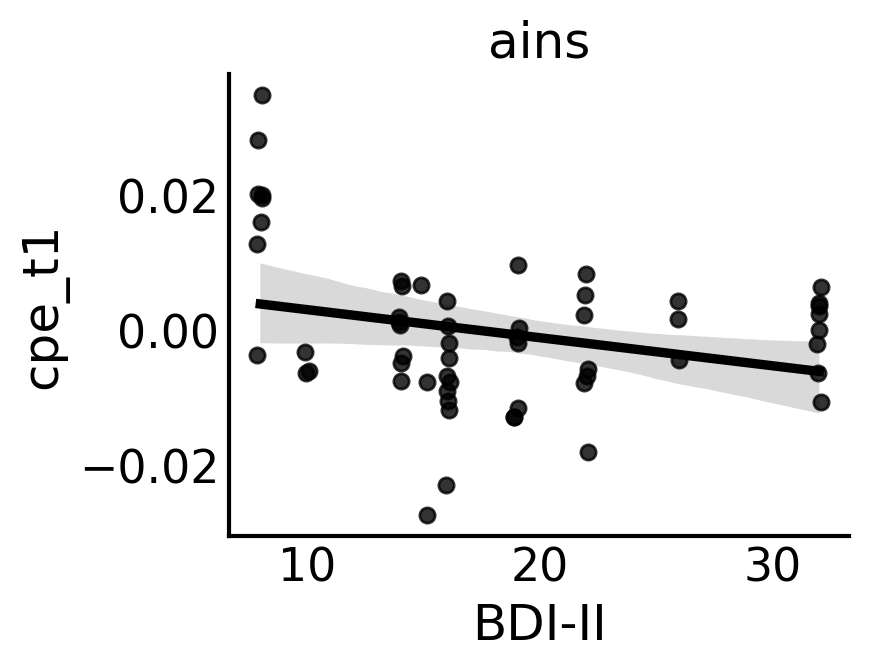

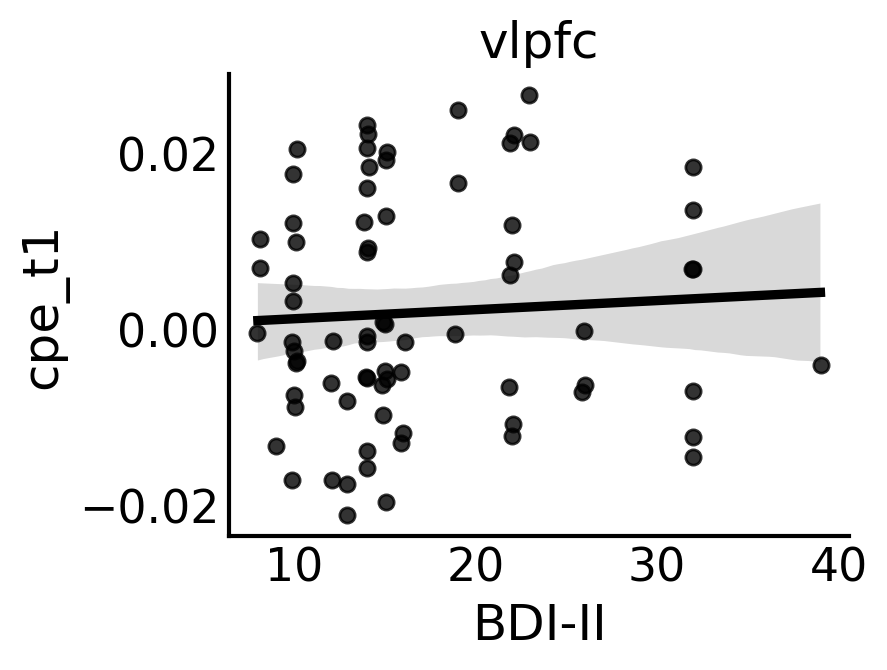

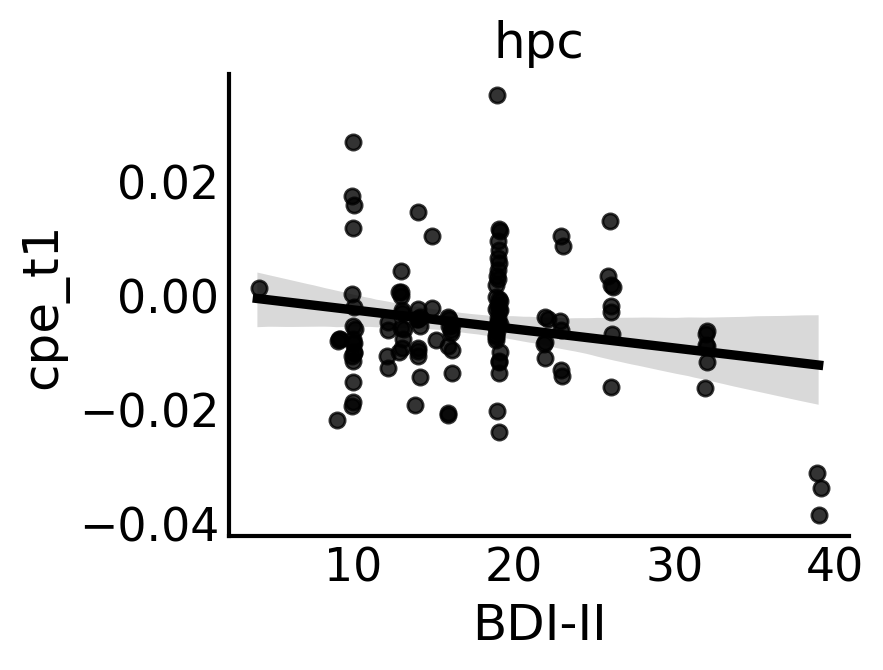

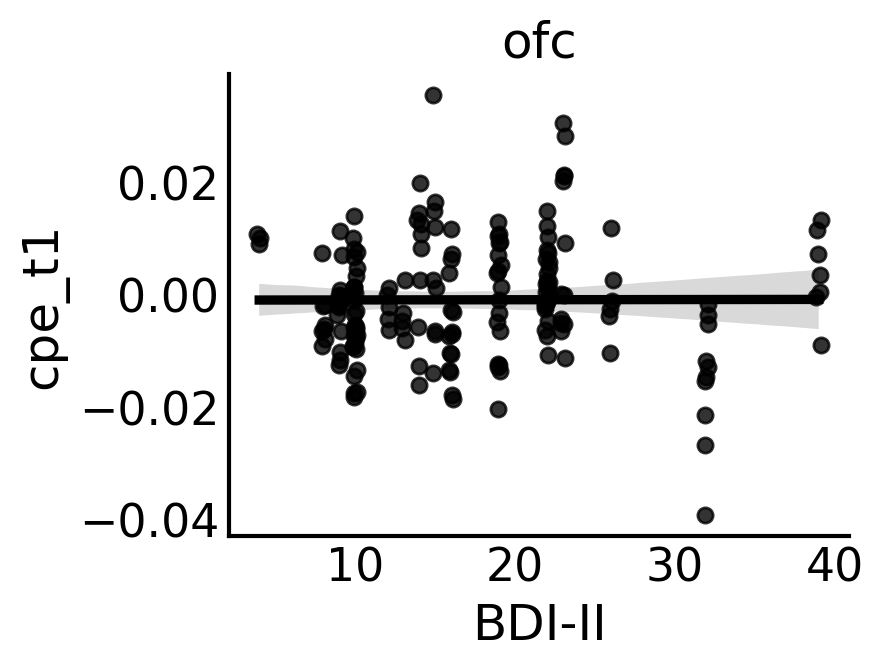

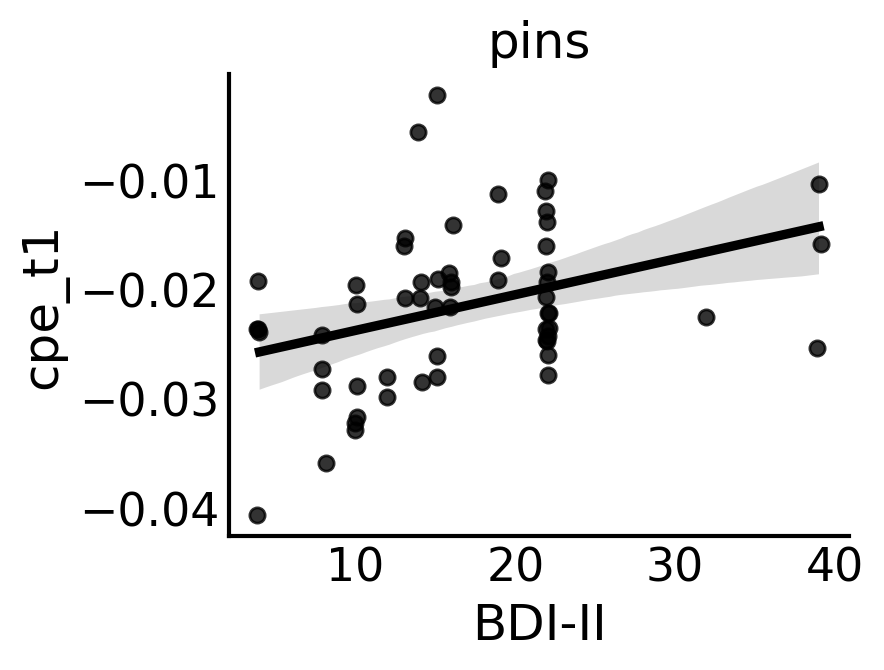

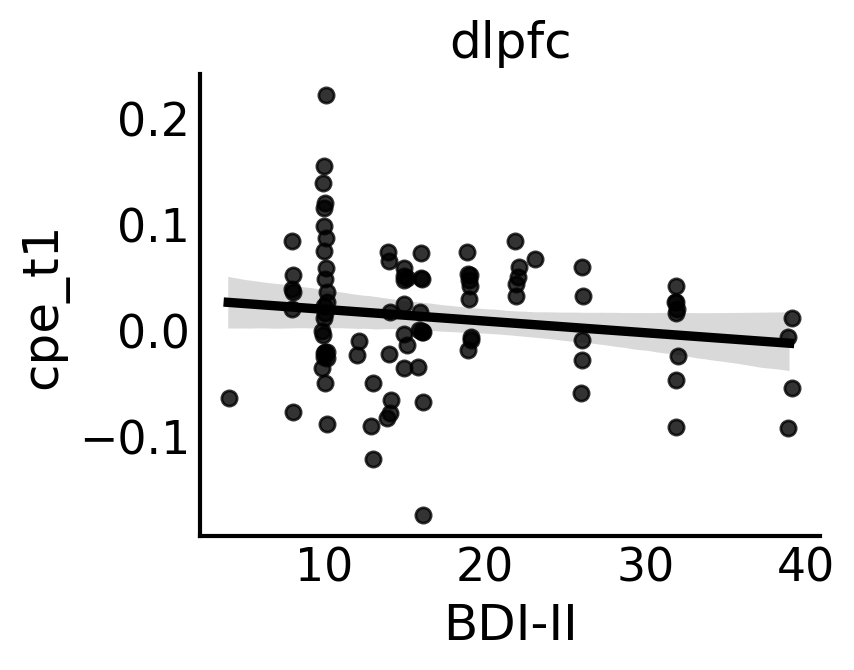

In [42]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [43]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:42:05                                         
No. Iterations:                    28                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.2006      0.548     29.565     

# Mood-CPE Interaction BDI Correlation

In [44]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data['norm_mood:cpe_t1'])
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.09907231329224214 0.20272845648748228
dmpfc pearsonr 0.37318234689723123 9.03683427352606e-08
amy pearsonr -0.23374646302998642 0.018055235636449677
ains pearsonr 0.20178323893404138 0.1322701837055427
vlpfc pearsonr 0.15575488995320594 0.182078981782021
hpc pearsonr -0.13918768643866927 0.12313531244545675
ofc pearsonr 0.09585812478550124 0.20179615804814274
pins pearsonr 0.015260929318013344 0.9094753749190291
dlpfc pearsonr 0.014769354672579185 0.8870358542696122


In [45]:
sig_rho

[('dmpfc', 0.37318234689723123, 9.03683427352606e-08),
 ('amy', -0.23374646302998642, 0.018055235636449677)]

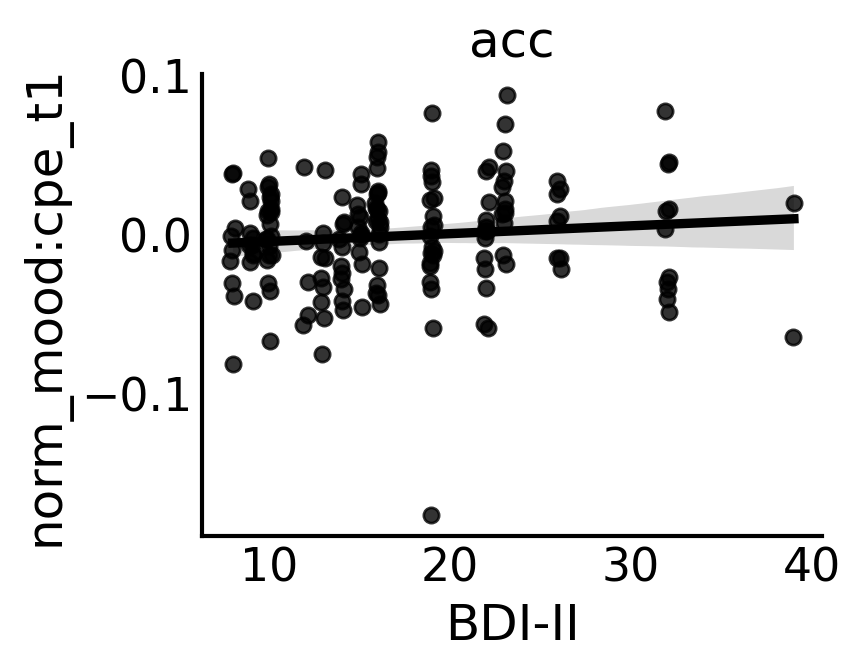

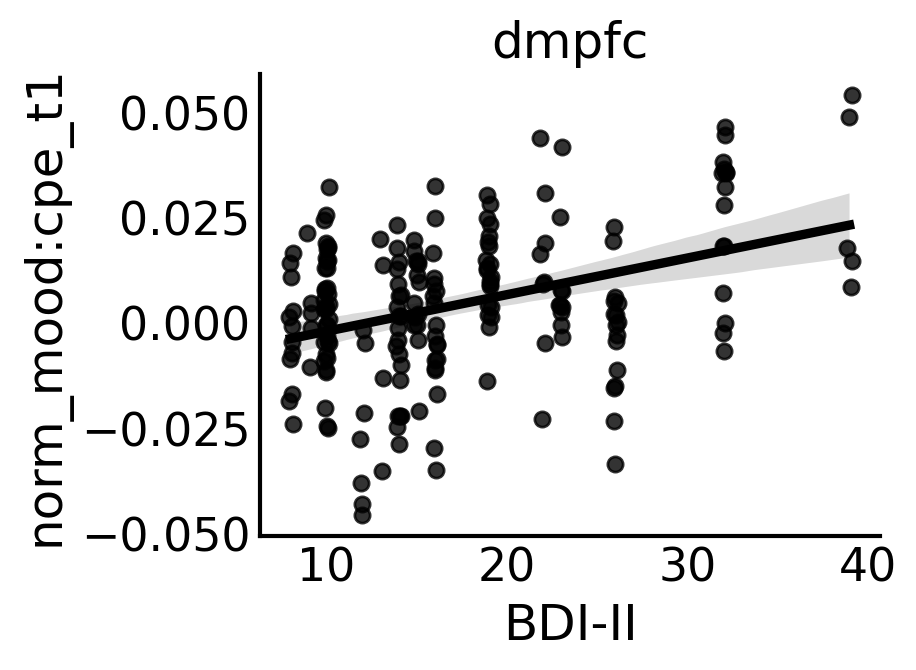

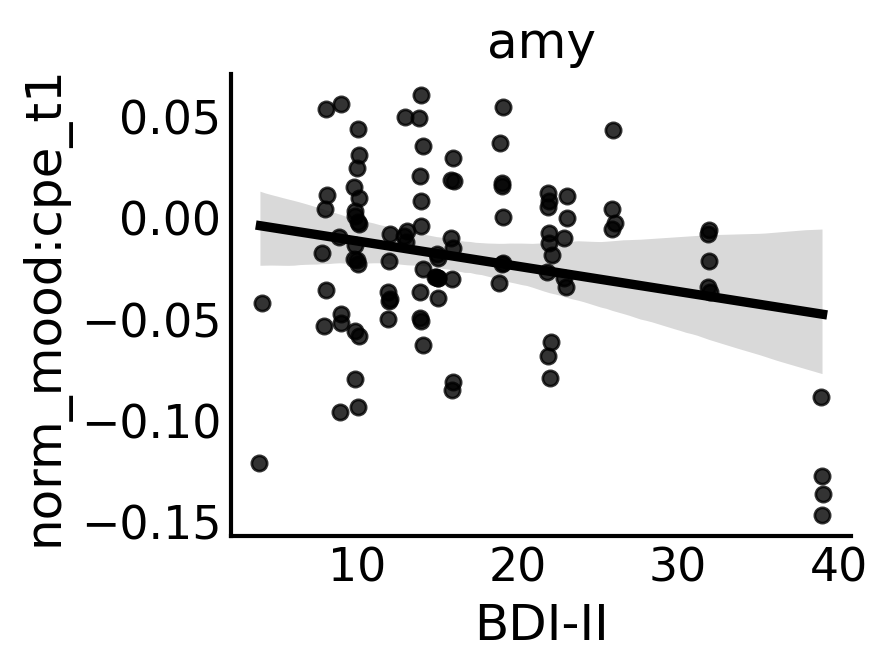

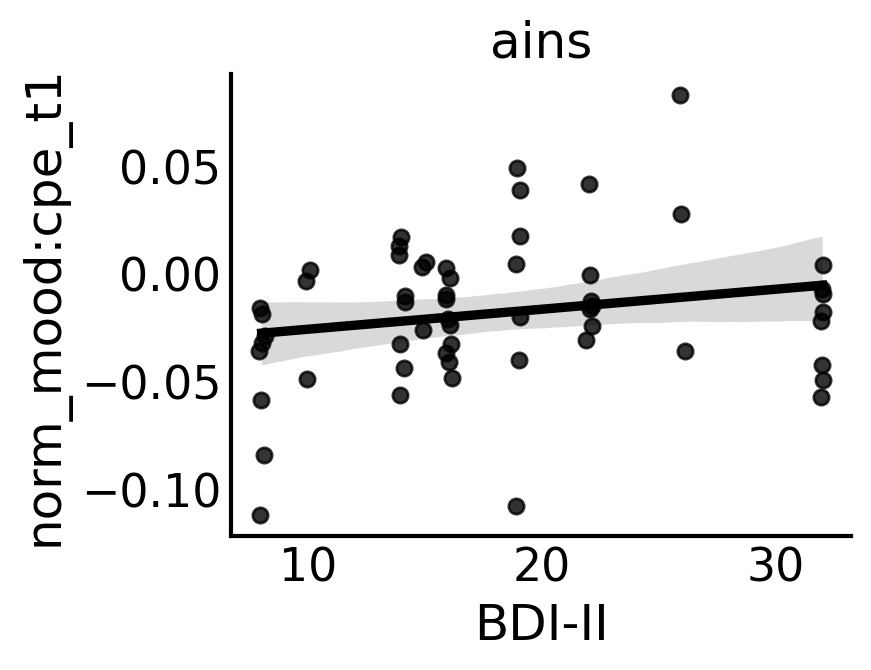

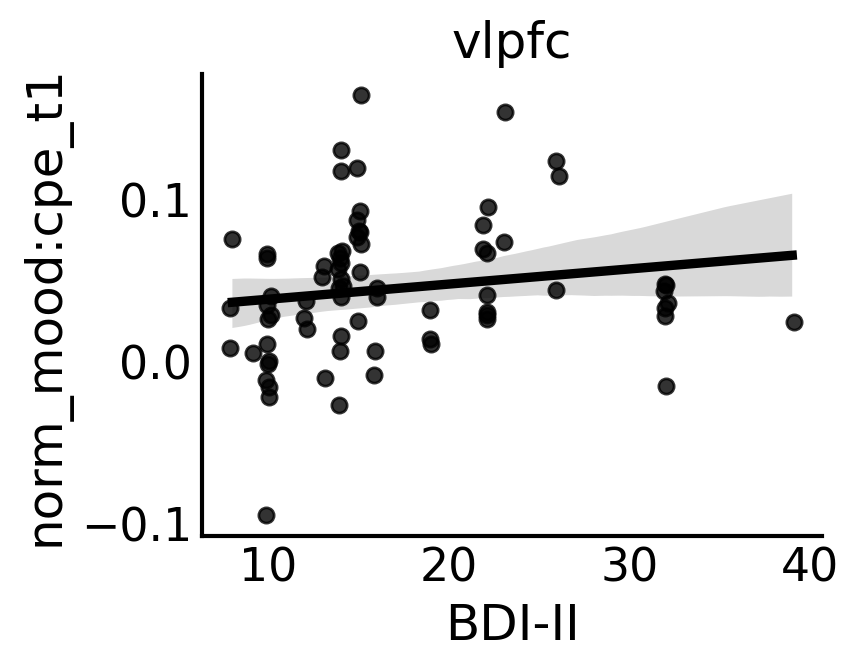

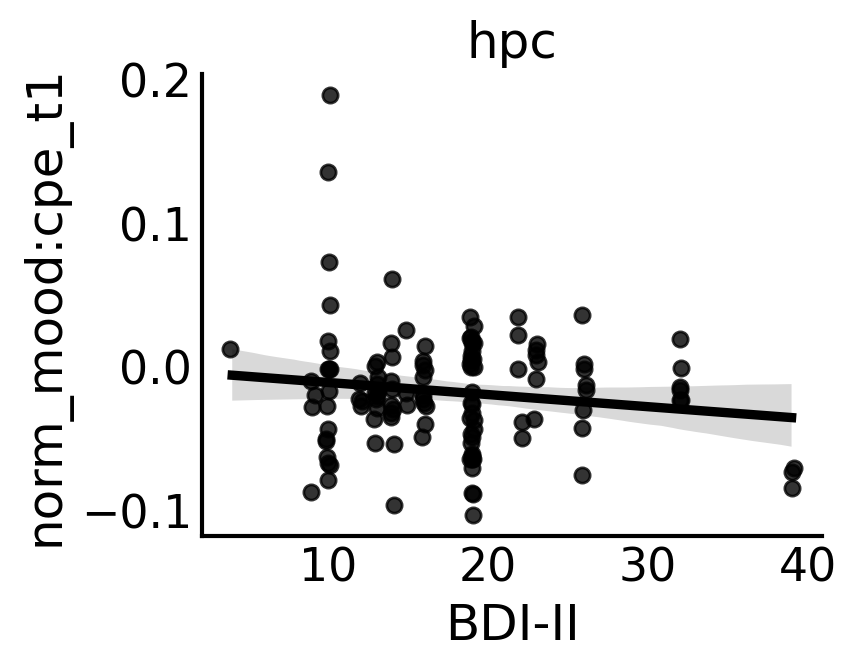

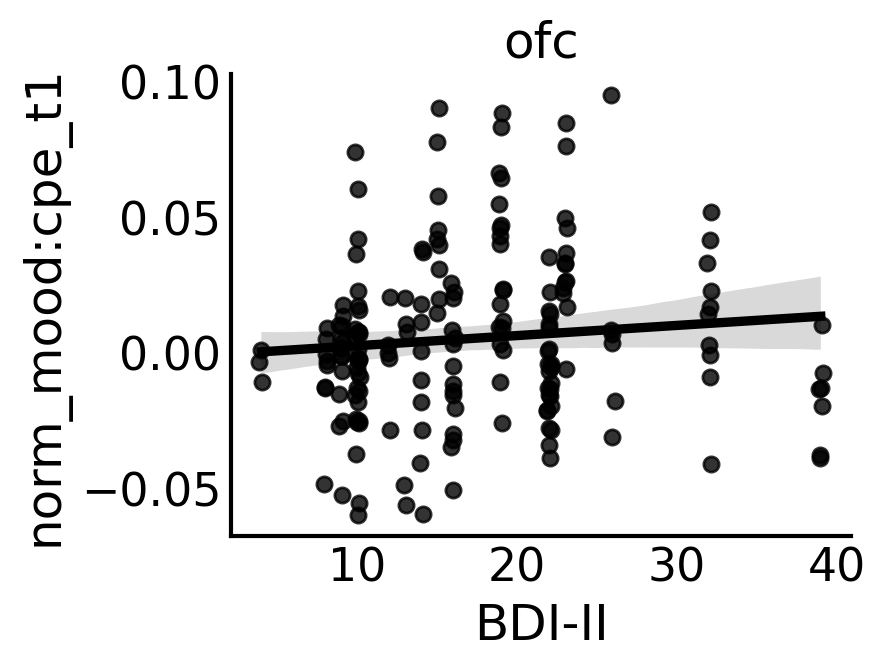

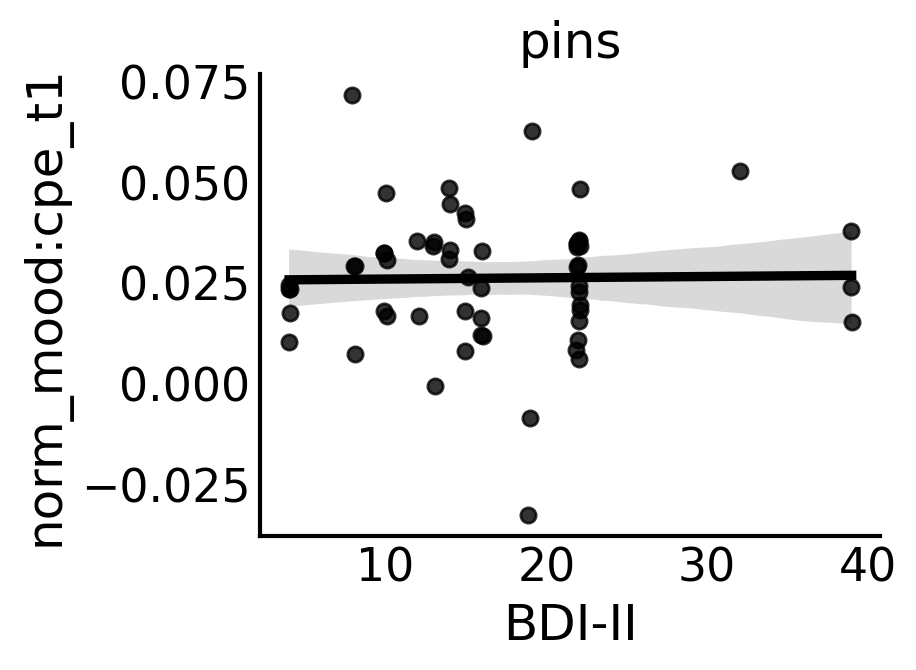

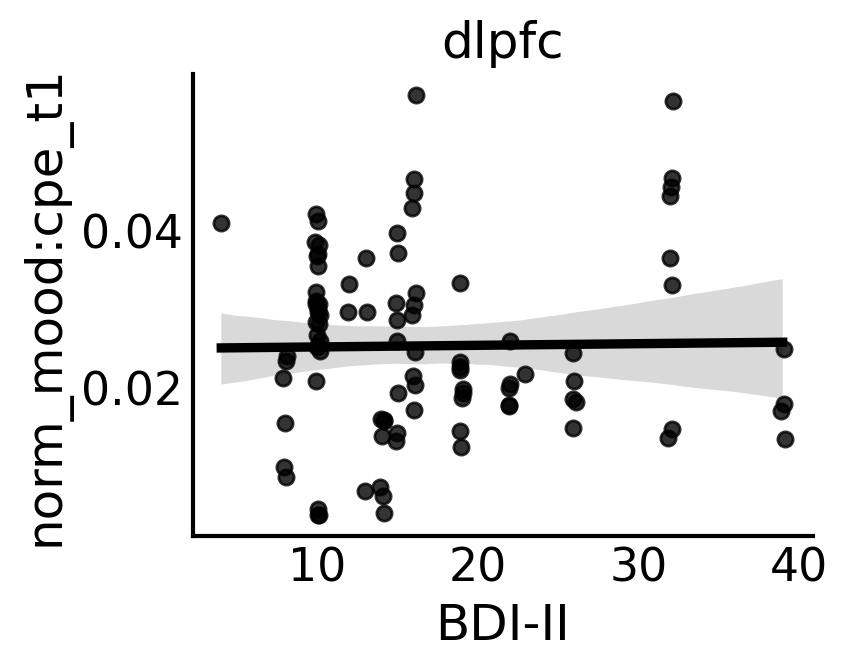

In [46]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood:cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [47]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df['norm_mood:cpe_t1'].values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:42:45                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5682      0.482     34.340     